In [ ]:
!gunzip listings.csv.gz

gzip: listings.csv already exists; do you wish to overwrite (y or n)? y


In [ ]:
# Importing required libraries
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()
from collections import Counter

In [ ]:
# Importing the listing dataset
df = pd.read_csv('listings.csv')
df.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,6713005,https://www.airbnb.com/rooms/6713005,20240503175146,2024-05-04,previous scrape,Large one bedroom,You'll share an apartment with two wonderful y...,NaN,https://a0.muscache.com/pictures/84725702/12f8...,35144920,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
1,922527181364298444,https://www.airbnb.com/rooms/922527181364298444,20240503175146,2024-05-03,city scrape,New Flushing Modern Apartment,This unique place has a style all its own.,NaN,https://a0.muscache.com/pictures/f5d74ed9-0b15...,420975523,...,5.00,4.45,5.00,NaN,t,3,3,0,0,1.10
2,794696802406920855,https://www.airbnb.com/rooms/794696802406920855,20240503175146,2024-05-04,previous scrape,Lovely studio in Hell's Kitchen!,Amazing location in the heart of Hell’s Kitche...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,43305568,...,5.00,4.91,4.91,NaN,f,1,1,0,0,0.69
3,54294086,https://www.airbnb.com/rooms/54294086,20240503175146,2024-05-03,city scrape,Luxury 1- bedroom rental unit with Hot tub,Relax with the whole family at this peaceful p...,NaN,https://a0.muscache.com/pictures/9613630a-19c4...,440355290,...,NaN,NaN,NaN,NaN,t,1,0,1,0,NaN
4,1039262508734112133,https://www.airbnb.com/rooms/1039262508734112133,20240503175146,2024-05-04,city scrape,Private room close to LGA,We are located 8 minutes from la guardia airpo...,NaN,https://a0.muscache.com/pictures/hosting/Hosti...,430854617,...,4.74,4.58,4.63,Exempt,t,3,0,3,0,3.77


### Data Cleaning

In [ ]:
df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [ ]:
# After viewing the multiple columns in the listings.csv from the data_description.txt,
# the following variables were picked for further analysis and dropped variables like date_scraped etc.
df = df[['id','name','longitude','latitude','description','instant_bookable','neighborhood_overview','neighbourhood_cleansed','host_id','host_name','host_since',
                 'host_response_time','review_scores_rating','property_type','room_type','accommodates','bathrooms','bedrooms','beds','reviews_per_month','amenities','number_of_reviews','price']]
df.head()

,id,name,longitude,latitude,description,instant_bookable,neighborhood_overview,neighbourhood_cleansed,host_id,host_name,...,property_type,room_type,accommodates,bathrooms,bedrooms,beds,reviews_per_month,amenities,number_of_reviews,price
0,6713005,Large one bedroom,-73.955170,40.767510,You'll share an apartment with two wonderful y...,f,NaN,Upper East Side,35144920,Kevin,...,Private room in rental unit,Private room,2,NaN,NaN,NaN,NaN,"[""Smoke alarm"", ""Air conditioning"", ""Fire exti...",0,NaN
1,922527181364298444,New Flushing Modern Apartment,-73.832370,40.754404,This unique place has a style all its own.,t,NaN,Flushing,420975523,Will,...,Entire rental unit,Entire home/apt,4,1.0,1.0,2.0,1.10,"[""Hair dryer"", ""Air conditioning"", ""Essentials...",11,$202.00
2,794696802406920855,Lovely studio in Hell's Kitchen!,-73.995836,40.762272,Amazing location in the heart of Hell’s Kitche...,f,NaN,Hell's Kitchen,43305568,Rüya,...,Entire rental unit,Entire home/apt,2,NaN,1.0,NaN,0.69,"[""Hair dryer"", ""Air conditioning"", ""Essentials...",11,NaN
3,54294086,Luxury 1- bedroom rental unit with Hot tub,-73.792790,40.697390,Relax with the whole family at this peaceful p...,t,NaN,Jamaica,440355290,Tavian,...,Private room in rental unit,Private room,2,1.0,1.0,1.0,NaN,"[""Exterior security cameras on property"", ""BBQ...",0,$342.00
4,1039262508734112133,Private room close to LGA,-73.867923,40.758789,We are located 8 minutes from la guardia airpo...,t,NaN,East Elmhurst,430854617,Bryan,...,Private room in rental unit,Private room,2,1.0,1.0,1.0,3.77,"[""Smoke alarm"", ""Air conditioning"", ""First aid...",19,$105.00


In [ ]:
# Replace NaN values with 0
df.fillna(0, inplace=True)

# Extract prices from df into df_price
df_price = df['price']
# Create an empty prices list
prices=[]

# Convert prices from df into float values and append it in prices list
for p in df_price:
    if isinstance(p, str):  # Check if the price is a string
        p = float(p[1:].replace(',', ''))
    else:  # If it's already numeric (int or float), directly use it
        p = float(p)
    prices.append(p)

# Replace the price column in the original df with the new prices
df['price'] = prices

In [ ]:
# Remove listings with 0 for  bedrooms, bathrooms, accomodates, price, beds, review_scores_rating, reviews_per_month
df = df[df.bedrooms > 0]
df = df[df.bathrooms > 0]
df = df[df.accommodates > 0]
df = df[df.price > 0]
df = df[df.beds > 0]
df = df[df.review_scores_rating > 0]
df = df[df.reviews_per_month > 0]

df.head()

,id,name,longitude,latitude,description,instant_bookable,neighborhood_overview,neighbourhood_cleansed,host_id,host_name,...,property_type,room_type,accommodates,bathrooms,bedrooms,beds,reviews_per_month,amenities,number_of_reviews,price
1,922527181364298444,New Flushing Modern Apartment,-73.832370,40.754404,This unique place has a style all its own.,t,0,Flushing,420975523,Will,...,Entire rental unit,Entire home/apt,4,1.0,1.0,2.0,1.10,"[""Hair dryer"", ""Air conditioning"", ""Essentials...",11,202.0
4,1039262508734112133,Private room close to LGA,-73.867923,40.758789,We are located 8 minutes from la guardia airpo...,t,0,East Elmhurst,430854617,Bryan,...,Private room in rental unit,Private room,2,1.0,1.0,1.0,3.77,"[""Smoke alarm"", ""Air conditioning"", ""First aid...",19,105.0
6,25274961,Beautiful cozy Room,-73.901900,40.754070,I have beautiful apartment close to Manhattan ...,t,Very close to Manhattan and LGA airport surrou...,Woodside,37842947,Heena,...,Private room in home,Private room,1,1.0,1.0,1.0,0.06,"[""Hair dryer"", ""Air conditioning"", ""Luggage dr...",4,125.0
7,692726447958336704,The Merchant Marine,-73.942210,40.677130,Forget your worries in this spacious and seren...,f,0,Crown Heights,83143535,Michelle,...,Private room in townhouse,Private room,2,2.0,1.0,1.0,2.73,"[""Smoke alarm"", ""Lock on bedroom door"", ""Air c...",57,70.0
10,52582634,Modern 3Bd Apartment - 20 Min to Manhattan,-73.769920,40.770130,PLEASE MESSAGE ME REGARDING SPACE SHARE PRIVAT...,f,0,Bayside,418115272,Billy,...,Entire home,Entire home/apt,8,1.0,3.0,4.0,0.77,"[""Hair dryer"", ""Dining table"", ""Coffee maker: ...",24,175.0


Number of room types : 4

room_type
Entire home/apt    7115
Private room       5765
Shared room         185
Hotel room           50
Name: count, dtype: int64


<ipython-input-118-7b66f7e94b5f>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  cat_plot = sb.catplot(x="room_type", data=df, kind="count", palette="Set1", height=6, aspect=1)


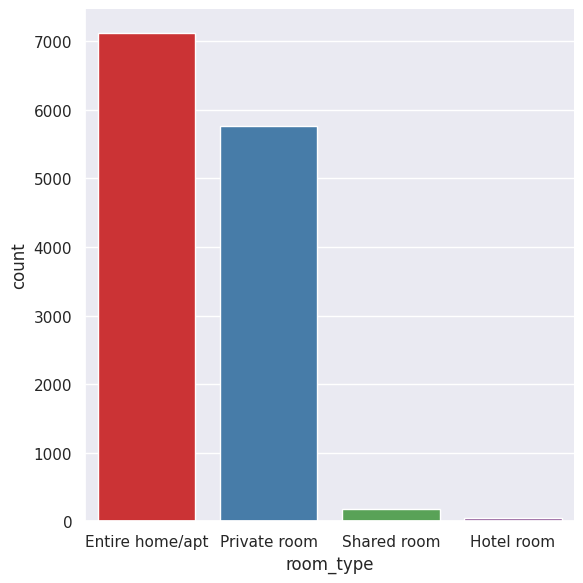

In [ ]:
# Number of room types
print("Number of room types :", len(df["room_type"].unique()))
print()

# Number of listings of each room type
print(df["room_type"].value_counts())
# sb.catplot(x = "room_type", data = df, kind = "count", palette="Set1")
cat_plot = sb.catplot(x="room_type", data=df, kind="count", palette="Set1", height=6, aspect=1)
# cat_plot.set_xticklabels(rotation=45)  # Optional: Rotate x labels for better visibility



### Analyzing the listings based on the property type.

Number of property types with more than 10 listings: 14

property_type
Entire rental unit             4901
Private room in rental unit    3063
Private room in home           1266
Entire home                     759
Private room in townhouse       525
Entire condo                    523
Entire townhouse                286
Private room in condo           263
Room in hotel                   217
Entire loft                     216
Entire guest suite              208
Room in boutique hotel          124
Private room in guest suite     110
Shared room in rental unit      105
Name: count, dtype: int64


<ipython-input-52-ff0487180509>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  cat_plot = sb.catplot(x="property_type", data=df_filtered, kind="count", palette="Set1", height=8, aspect=2, order=filtered_property_types.index)


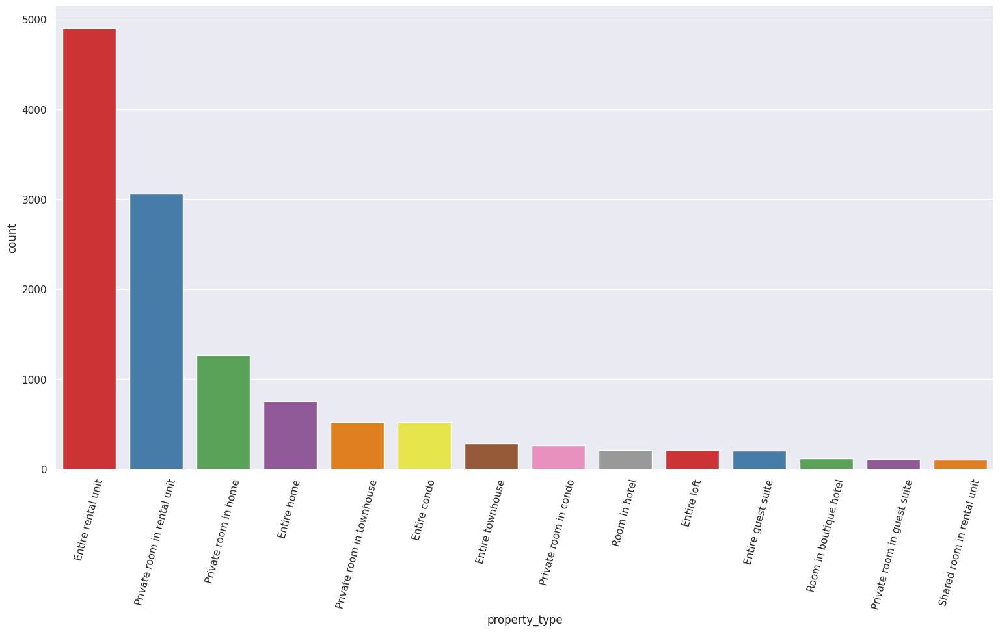

In [ ]:
import seaborn as sb
import matplotlib.pyplot as plt

# Calculate the counts of each property type
property_counts = df["property_type"].value_counts()

# Filter to include only property types with more than 100 listings
filtered_property_types = property_counts[property_counts > 100]

# Sort the filtered property types by count
filtered_property_types = filtered_property_types.sort_values(ascending=False)

# Print the number of unique property types
print("Number of property types with more than 10 listings:", len(filtered_property_types))
print()

# Print the filtered counts
print(filtered_property_types)

# Create a DataFrame from the filtered and sorted index
df_filtered = df[df["property_type"].isin(filtered_property_types.index)]

# Create the plot
cat_plot = sb.catplot(x="property_type", data=df_filtered, kind="count", palette="Set1", height=8, aspect=2, order=filtered_property_types.index)
cat_plot.set_xticklabels(rotation=75)  # Rotate x labels for better visibility
plt.show()


### Analyzing the prices for the different room and property types.

In [ ]:
# Checking out the mean prices for the different room and property types
df_roomProperty = df.groupby(['property_type','room_type']).price.mean()
df_roomProperty = df_roomProperty.reset_index()
df_roomProperty=df_roomProperty.sort_values('price',ascending=[0])
df_roomProperty.head()

,property_type,room_type,price
18,Private room,Private room,586.125000
41,Room in aparthotel,Entire home/apt,488.650000
43,Room in boutique hotel,Hotel room,479.733333
13,Entire townhouse,Entire home/apt,433.804196
44,Room in boutique hotel,Private room,392.348624


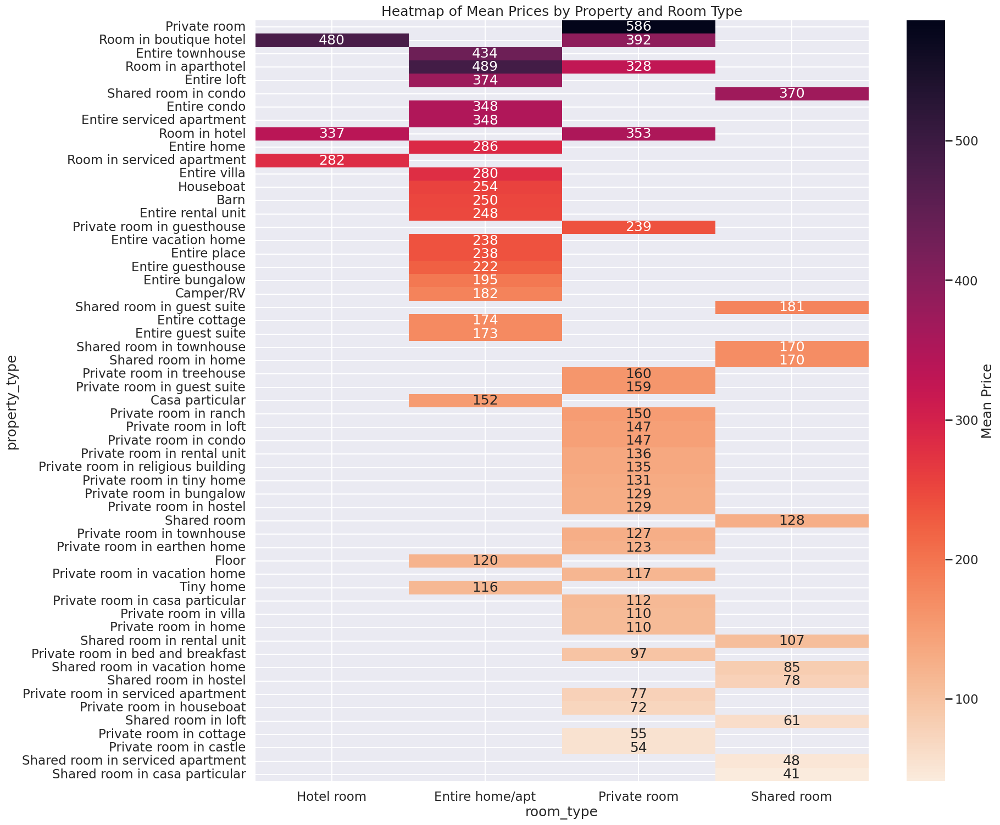

In [ ]:
# # # Plotting a heatmap of the mean price for room type and a property type

import seaborn as sb
import matplotlib.pyplot as plt
import pandas as pd

# Calculate the mean price for each combination of property_type and room_type
mean_prices = df.groupby(['property_type', 'room_type']).price.mean().unstack()

# Sort the DataFrame by the mean prices for better readability in the heatmap
# Sorting each column in descending order of mean prices
sorted_columns = mean_prices.mean().sort_values(ascending=False).index
sorted_index = mean_prices.mean(axis=1).sort_values(ascending=False).index

mean_prices_sorted = mean_prices.loc[sorted_index, sorted_columns]

# Creating the heatmap with sorted data
plt.figure(figsize=(18, 18))
heatmap = sb.heatmap(mean_prices_sorted, annot=True, fmt=".0f", cmap=sb.cm.rocket_r, cbar_kws={'label': 'Mean Price'})
plt.title("Heatmap of Mean Prices by Property and Room Type")
plt.show()




### Anaylzing the listings based on the number of bedrooms.

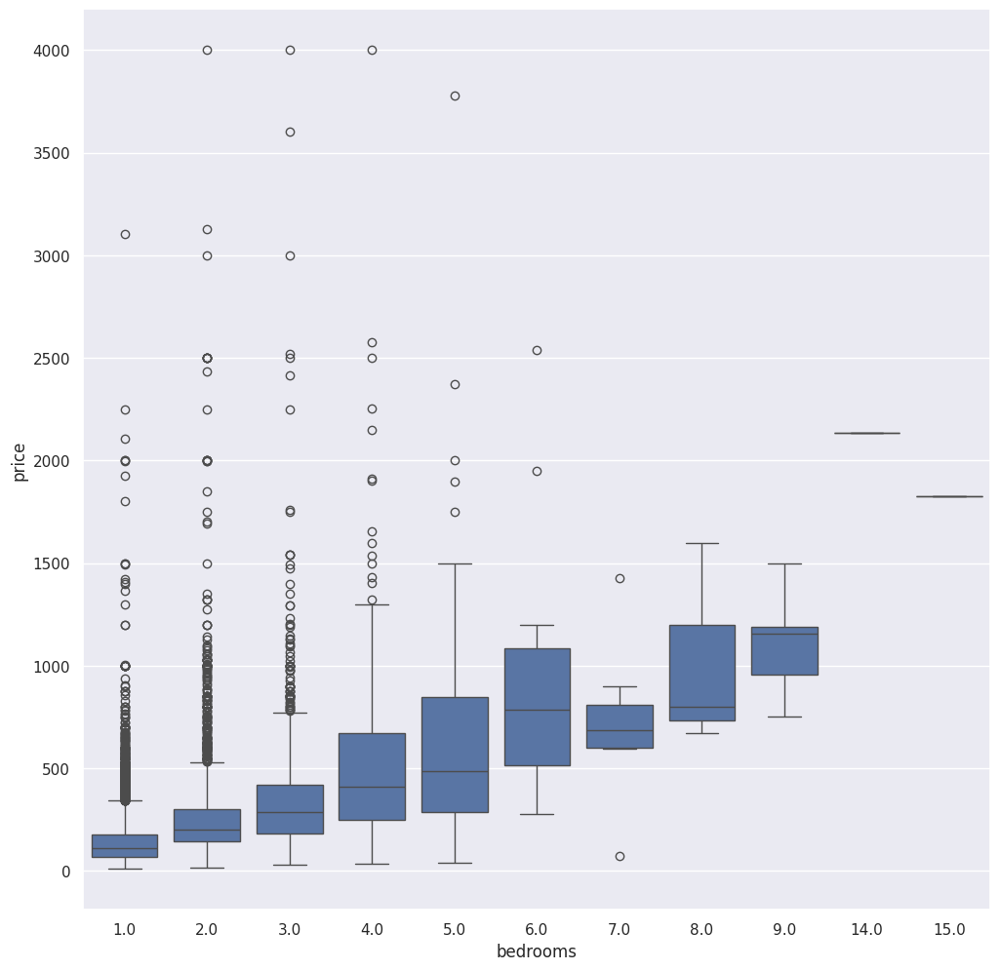

In [ ]:
# Plotting a boxplot to quickly see if there is any trend between price and no. bedrooms
# Further reduce the threshold for outliers if necessary
max_price_threshold = 5000
filtered_df = df[df['price'] <= max_price_threshold]
# plt.figure(figsize=(12,12))
# sb.boxplot(x='bedrooms', y='price', data=df[['bedrooms', 'price']])



# Creating the boxplot with filtered data
plt.figure(figsize=(12, 12))
boxplot = sb.boxplot(x='bedrooms', y='price', data=filtered_df)

# Set y-axis to logarithmic scale
# boxplot.set_yscale('log')

# Limit x-axis for bedrooms if necessary
# boxplot.set_xlim(-0.5, 10.5)  # Adjust based on the range of bedrooms you want to show

# plt.title("Boxplot of Prices by Number of Bedrooms (with reduced outliers)")
# plt.show()


In [ ]:
# Creating a number of rooms vs property type dataframe
df_room_beds = df[['property_type', 'bedrooms']]
df_room_beds.head(n=15)

,property_type,bedrooms
1,Entire rental unit,1.0
4,Private room in rental unit,1.0
6,Private room in home,1.0
7,Private room in townhouse,1.0
10,Entire home,3.0
19,Entire rental unit,1.0
24,Shared room in rental unit,2.0
26,Private room in rental unit,1.0
32,Entire rental unit,1.0
42,Entire rental unit,2.0


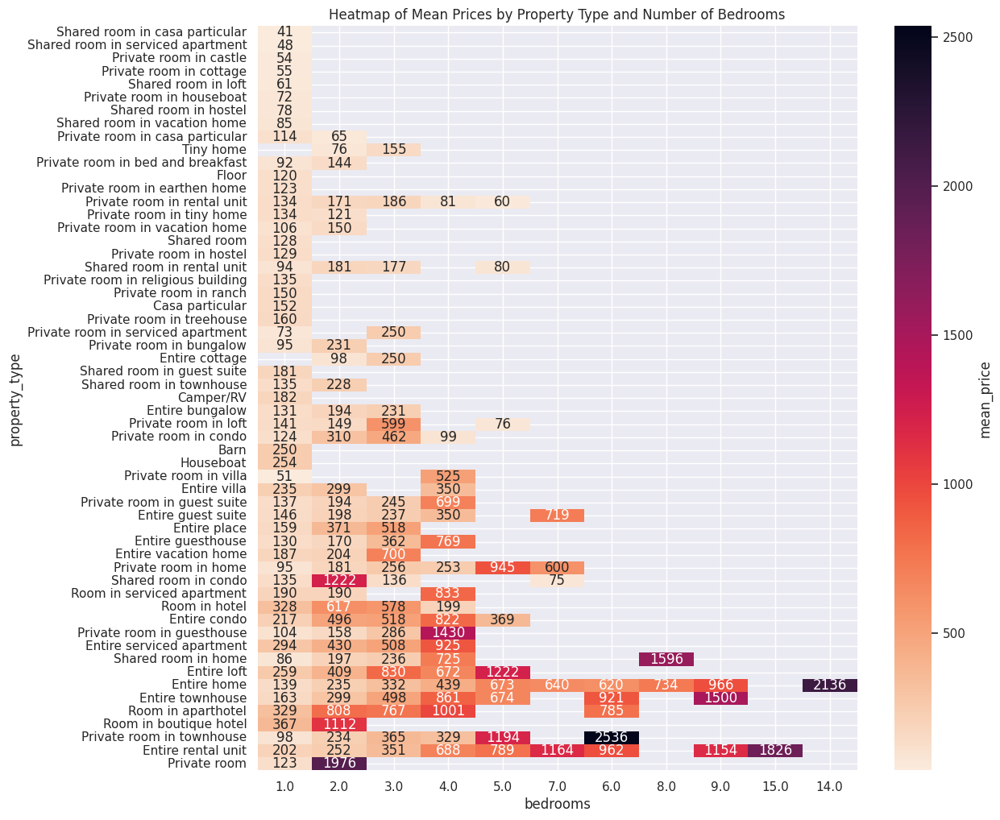

In [ ]:
# Plotting a heatmap of prices with number of bedrooms for listings

# plt.figure(figsize=(12,12))
# sb.heatmap(df.groupby(['property_type', 'bedrooms']).price.mean().unstack(),annot=True, fmt=".0f", cmap = sb.cm.rocket_r, cbar_kws={'label': 'mean_price'})
import seaborn as sb
import matplotlib.pyplot as plt
import pandas as pd

# Calculate the mean price for each combination
price_means = df.groupby(['property_type', 'bedrooms']).price.mean().unstack()

# Sort columns (bedrooms) by their mean values across all property types
sorted_columns = price_means.mean(axis=0).sort_values().index

# Sort rows (property types) by the mean price across all bedrooms
sorted_rows = price_means.mean(axis=1).sort_values().index

# Sort the DataFrame by the new index and columns
sorted_price_means = price_means.loc[sorted_rows, sorted_columns]

# Create the heatmap
plt.figure(figsize=(12, 12))
heatmap = sb.heatmap(sorted_price_means, annot=True, fmt=".0f", cmap=sb.cm.rocket_r, cbar_kws={'label': 'mean_price'})
plt.title('Heatmap of Mean Prices by Property Type and Number of Bedrooms')
plt.show()


In [ ]:
# Number of bedrooms
print("Number of bedrooms :", len(df["bedrooms"].unique()))
print()
print("BedRms|Listings")
# Number of listings of each room type
print(df["bedrooms"].value_counts())

Number of bedrooms : 11

BedRms|Listings
bedrooms
1.0     9042
2.0     2635
3.0     1026
4.0      277
5.0       91
6.0       27
7.0        7
9.0        5
8.0        3
15.0       1
14.0       1
Name: count, dtype: int64


In [ ]:
import nltk
from nltk.corpus import stopwords
import re

# Download the punkt tokenizer models
nltk.download('punkt')

# Download the stopwords as well since it seems you might be using them too
nltk.download('stopwords')

# Download WordNet lemmatizer if you plan to use it
nltk.download('wordnet')

# Create a dataframe of the words that appear in the ammenities section of the most expensive listings

df_amenities = df[['amenities','price','id',]]
df_amenitiesTopper = df_amenities.sort_values('price',ascending=[0])
df_amenitiestop=df_amenitiesTopper.head(30)
allemenities = ''
for index,row in df_amenitiestop.iterrows():
    p = re.sub('[^a-zA-Z]+',' ', row['amenities'])
    allemenities+=p

allemenities_data=nltk.word_tokenize(allemenities)
filtered_data=[word for word in allemenities_data if word not in stopwords.words('english')]
wnl = nltk.WordNetLemmatizer()
allemenities_data=[wnl.lemmatize(data) for data in filtered_data]
allemenities_words=' '.join(allemenities_data)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


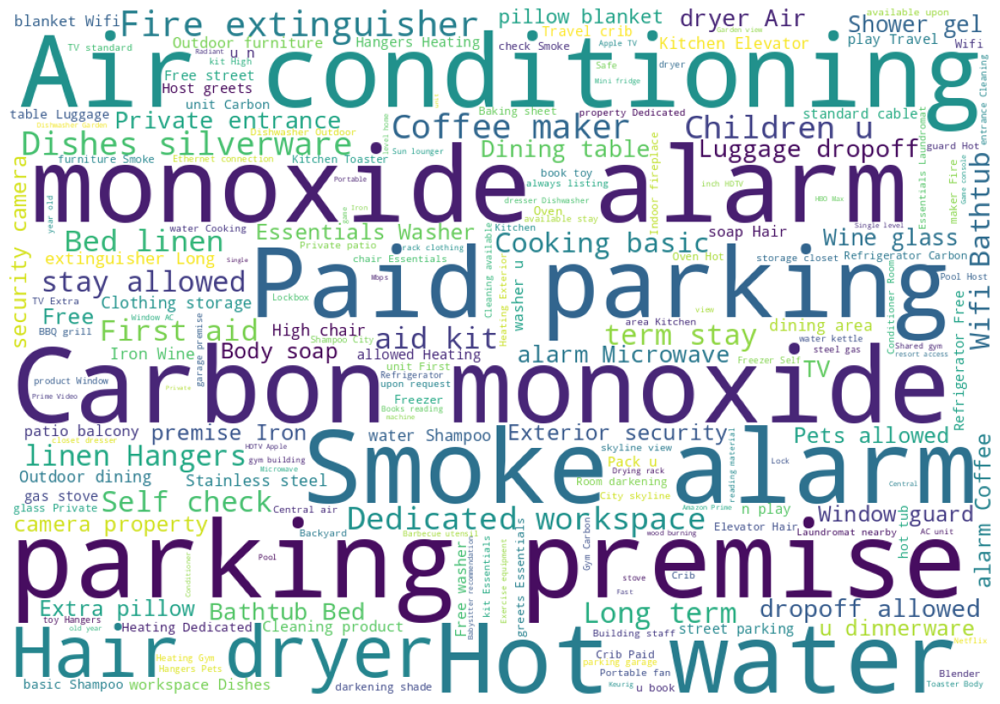

In [ ]:
from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(width = 1000, height = 700, background_color="white").generate(allemenities_words)
plt.figure(figsize=(15,15))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

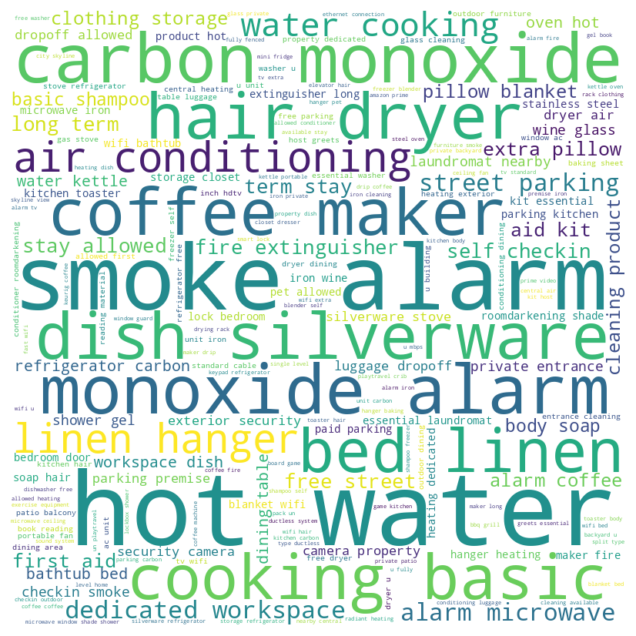

In [ ]:
all_amenities = ' '.join(df['amenities'])

# Normalize text: lowercasing, removing non-alphabet characters
all_amenities = re.sub('[^a-zA-Z ]', '', all_amenities).lower()

# Tokenize and filter out stopwords
tokens = nltk.word_tokenize(all_amenities)
tokens = [token for token in tokens if token not in stopwords.words('english')]

# Optional: Lemmatize the tokens to reduce them to base forms
lemmatizer = nltk.WordNetLemmatizer()
lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]

# Join tokens to create a single text string for the word cloud
cleaned_text = ' '.join(lemmatized_tokens)

# Generate and display the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(cleaned_text)

plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud, interpolation='bilinear')  # 'bilinear' interpolation for smoother appearance
plt.axis("off")
plt.show()

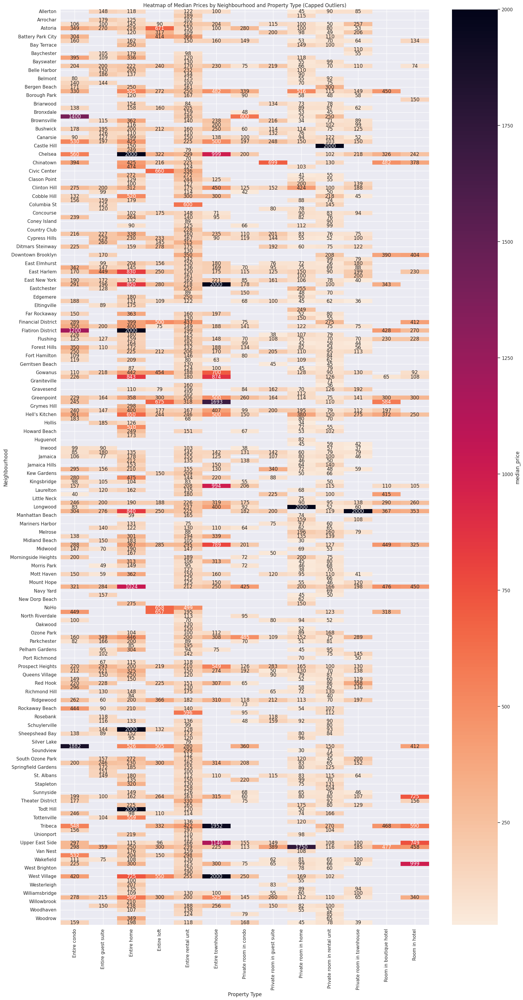

In [ ]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import numpy as np

# Example DataFrame loading
# df = pd.read_csv('your_data.csv')

# Set a minimum count threshold for property types
count_threshold = 105  # Adjust this threshold as needed

# Calculate the count for each property type
property_type_counts = df['property_type'].value_counts()

# Filter to retain only property types with counts above the threshold
frequent_property_types = property_type_counts[property_type_counts > count_threshold].index

# Filter the DataFrame to include only these property types
filtered_df = df[df['property_type'].isin(frequent_property_types)]

# Group by neighbourhood and property type, then calculate median price
median_prices = filtered_df.groupby([
    'neighbourhood_cleansed', 'property_type']).price.median().unstack()

# Define a hardcoded threshold for capping outliers
hardcoded_threshold = 2000  # Example threshold, adjust as needed

# Cap values above the hardcoded threshold using DataFrame operation
median_prices = median_prices.clip(upper=hardcoded_threshold)

# Plot the heatmap
plt.figure(figsize=(20, 40))
heatmap = sb.heatmap(median_prices, annot=True, fmt=".0f", cmap=sb.cm.rocket_r, cbar_kws={'label': 'median_price'})
plt.xlabel('Property Type')  # Ensuring xlabel is set
plt.ylabel('Neighbourhood')  # Ensuring ylabel is set
plt.title("Heatmap of Median Prices by Neighbourhood and Property Type (Capped Outliers)")
plt.show()


In [ ]:
# Geographical Clusters to find out which area in Boston has maximum listings on Airbnb

# seggregating each type of property

home = df[(df.room_type == 'Entire home/apt')]
private = df[(df.room_type == 'Private room')]
shared = df[(df.room_type == 'Shared room')]

location_home = home[['latitude', 'longitude']]
location_private = private[['latitude', 'longitude']]
location_shared = shared[['latitude', 'longitude']]

In [ ]:
from bokeh.io import push_notebook, show, output_notebook
import os
from bokeh.plotting import gmap
from bokeh.models import GMapOptions, ColumnDataSource, Circle, BoxSelectTool

output_notebook()
map_options = GMapOptions(lat=40.7209,lng=-74.0007, map_type="roadmap", zoom=11)

'''
plot = GMapPlot(
    x_range=DataRange1d(), y_range=DataRange1d(), map_options=map_options,width=1200, height=750
)
'''
plot = gmap("", map_options, title="NewYork")

source = ColumnDataSource(
    data=dict(
        lat_home=location_home['latitude'],
        lon_home=location_home['longitude'],
        lat_private=location_private['latitude'],
        lon_private=location_private['longitude'],
        lat_shared=location_shared['latitude'],
        lon_shared=location_shared['longitude']
    )
)


circle_home = Circle(x="lon_home", y="lat_home", size=4, fill_color="yellow", fill_alpha=0.9, line_color=None)
circle_private =  Circle(x="lon_private", y="lat_private", size=4, fill_color="red", fill_alpha=0.9, line_color=None)
circle_shared =  Circle(x="lon_shared", y="lat_shared", size=4, fill_color="blue", fill_alpha=0.9, line_color=None)

plot.add_glyph(source, circle_home)
plot.add_glyph(source, circle_private)
plot.add_glyph(source, circle_shared)

plot.add_tools(BoxSelectTool())

#from bokeh.plotting import figure, output_file, save
#output_file("map.html")
#save(plot)

In [ ]:
show(plot)

In [ ]:
# Finding the number of listings for each neighbourhood and median price
# Grouping neighbourhood by number of listings and then cleaning them

neighbourhood_DF=home.groupby('neighbourhood_cleansed').id.count()
neighbourhood_DF=neighbourhood_DF.reset_index()
neighbourhood_DF=neighbourhood_DF.rename(columns={'id':'Number_Of_Listings'})
neighbourhood_DF=neighbourhood_DF.sort_values('Number_Of_Listings',ascending=[0])
neighbourhood_DF.head()

,neighbourhood_cleansed,Number_Of_Listings
12,Bedford-Stuyvesant,517
187,Upper East Side,344
200,Williamsburg,339
91,Harlem,331
92,Hell's Kitchen,314


In [ ]:
# Grouping neighbourhood by average price of listings and cleaning them

neighbourhoodPrice_DF=home.groupby('neighbourhood_cleansed').price.median()
neighbourhoodPrice_DF=neighbourhoodPrice_DF.reset_index()
neighbourhoodPrice_DF=neighbourhoodPrice_DF.rename(columns={'price':'Median_Price'})
neighbourhoodPrice_DF=neighbourhoodPrice_DF.sort_values('Median_Price',ascending=[0])
neighbourhoodPrice_DF.head()

,neighbourhood_cleansed,Median_Price
179,Todt Hill,1060.0
156,Roosevelt Island,596.0
133,NoHo,578.5
95,Holliswood,510.0
71,Financial District,431.0


In [ ]:
# Merging the two dataframes

mergeDF=pd.merge(neighbourhood_DF,neighbourhoodPrice_DF,on='neighbourhood_cleansed')
mergeDF.head()

,neighbourhood_cleansed,Number_Of_Listings,Median_Price
0,Bedford-Stuyvesant,517,185.0
1,Upper East Side,344,170.5
2,Williamsburg,339,225.0
3,Harlem,331,188.0
4,Hell's Kitchen,314,260.0


Text(0, 0.5, 'Number_Of_Listings')

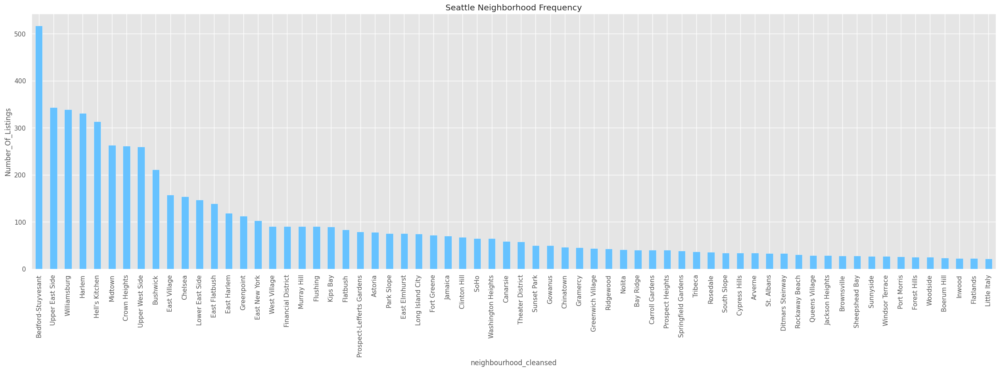

In [ ]:
# Visualizing the number of listings for each neighbourhood
import matplotlib
matplotlib.style.use('ggplot')

threshold = 20
filtered_neighbourhood_DF = neighbourhood_DF[neighbourhood_DF['Number_Of_Listings'] > threshold]

# Plotting the data
filtered_neighbourhood_DF.plot(kind='bar',
                               x='neighbourhood_cleansed',
                               y='Number_Of_Listings',
                               color = '#66c2ff',
                               figsize =(30,8),
                               title = 'Seattle Neighborhood Frequency',
                               legend = False)


plt.ylabel('Number_Of_Listings')

<ipython-input-135-fe9ca5ccf804>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sb.boxplot(


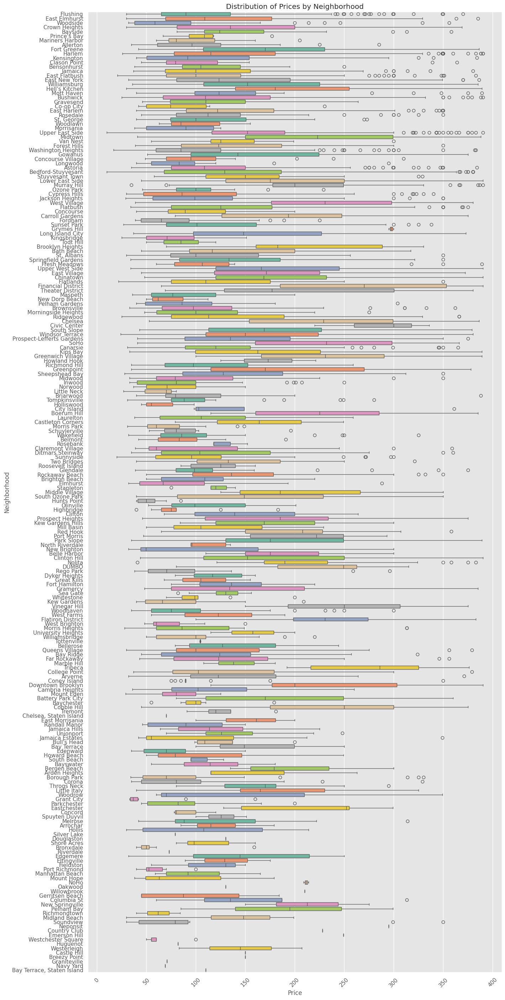

In [ ]:
import seaborn as sb
import matplotlib.pyplot as plt

# Filter data to remove extreme outliers for clarity
price_threshold = df['price'].quantile(0.90)  # Keeps the top 5% prices
df_filtered = df[df['price'] <= price_threshold]

# Create a horizontal boxplot
plt.figure(figsize=(15, 35))
boxplot = sb.boxplot(
    y="neighbourhood_cleansed",
    x="price",
    data=df_filtered,
    palette="Set2",
    orient='h'  # Horizontal orientation
)

# Improve the readability of the plot
plt.xlabel("Price")
plt.ylabel("Neighborhood")
plt.title("Distribution of Prices by Neighborhood")
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


Text(0, 0.5, 'Median Price')

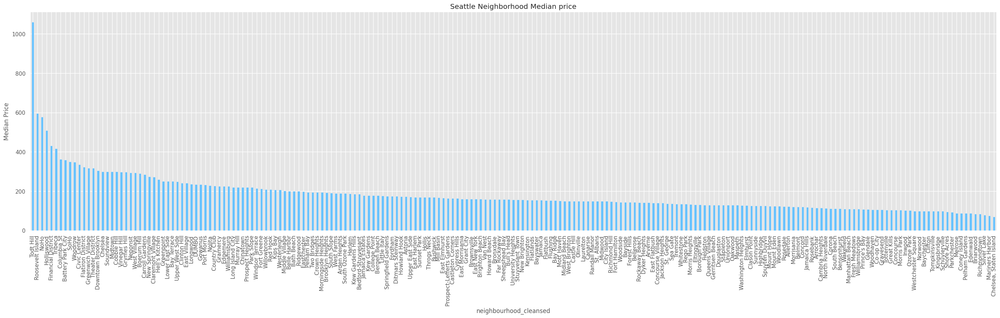

In [ ]:
matplotlib.style.use('ggplot')

objects = neighbourhoodPrice_DF['neighbourhood_cleansed']
y_pos = neighbourhoodPrice_DF['Median_Price']

neighbourhoodPrice_DF.plot(kind='bar',
           x='neighbourhood_cleansed',
           y='Median_Price',
           color = '#66c2ff',
           figsize =(35,8),
           title = 'New York Neighborhood Median price',
           legend = False)

plt.ylabel('Median Price')

In [ ]:
# Importing the listing dataset
df = pd.read_csv('listings.csv')
df.head()
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

In [ ]:
# Creating a dataframe of the summaries of the 100 most expensive listings
df_summary = df[['description','price']]
df_summary = df_summary[pd.notnull(df_summary['description'])]
df_summary = df_summary[df_summary['description']!=0]
df_summary = df_summary.sort_values('price',ascending=[0])
top100DF = df_summary.head(100)
top100DF.head()

,description,price
10466,Prime Location! Prefer long stays! Apartment i...,100000.0
19732,This stunning and stylish place to stay is per...,9002.0
14272,Originally built in 1872 for Engine Company 11...,7500.0
19607,This amazing apartment is convenient and spaci...,7498.0
37576,Spectacular waterfront escape built by designe...,4000.0


In [ ]:
from nltk.corpus import stopwords
import string
import nltk

# Some data cleaning
# Ensure necessary NLTK resources are downloaded
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

words=''
for index,row in top100DF.iterrows():
    words += row['description']

string_punctuation = string.punctuation
ignoreChar=['\r','\n','',' ',"'s",'br']
nums=['0','1','2','3','4','5','6','7','8','9']
summary_data=nltk.word_tokenize(words)
words_only = [l.lower() for l in summary_data if l not in string_punctuation if l not in ignoreChar if l not in nums]
filtered_data=[word for word in words_only if word not in stopwords.words('english')]
wnl = nltk.WordNetLemmatizer()
final_data=[wnl.lemmatize(data) for data in filtered_data]
final_words=' '.join(final_data)
final_words[:50]

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


'prime location prefer long stay apartment one bloc'

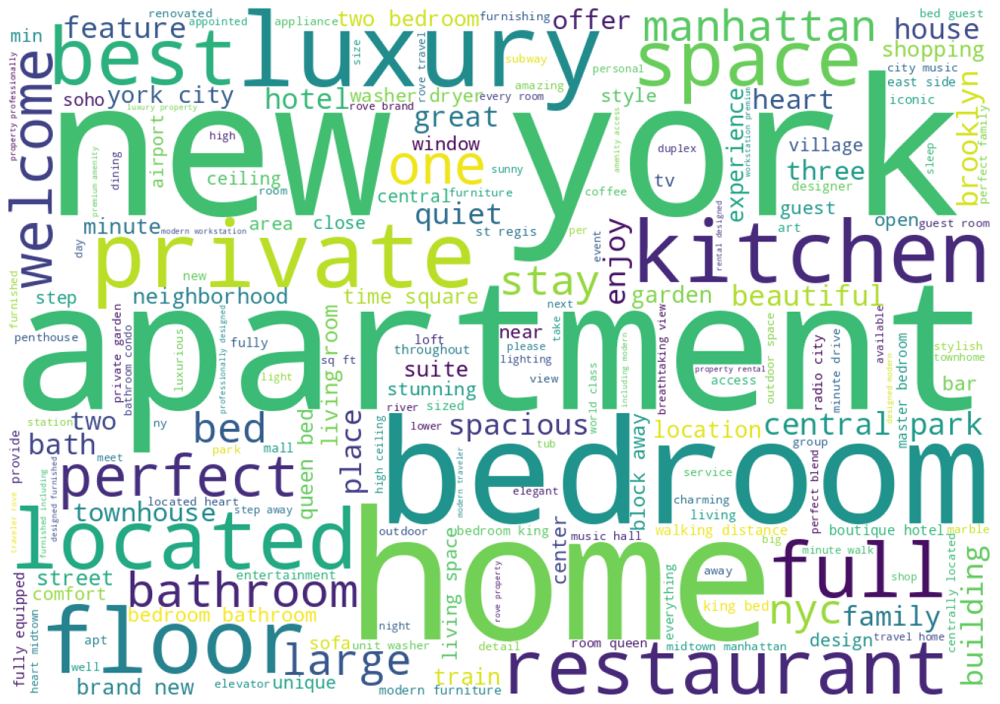

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

wordcloud = WordCloud(width = 1000, height = 700, background_color="white").generate(final_words)
plt.figure(figsize=(18,12))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [ ]:
# Creating a dataframe of the summaries of the 100 most cheapest listings
summaryLowDF = df[['description','price']]
summaryLowDF = summaryLowDF[pd.notnull(summaryLowDF['description'])]
summaryLowDF = summaryLowDF[summaryLowDF['description']!=0]
summarLowyDF = summaryLowDF.sort_values('price',ascending=[1])
bot100DF = summaryLowDF.head(100)
bot100DF.sample(n=5)

,description,price
148,The amount of space tends to surprise several ...,125.0
297,A private bedroom suite with bathroom. A mode...,141.0
230,1 bedroom Located in the heart of Brooklyn Cro...,157.0
243,Near LGA we have rooms in a private house 2n...,72.0
120,*AVAILABLE FOR SHORT or LONG - MSG FOR DETAILS...,150.0


In [ ]:
# Some data cleaning

words=''
for index,row in bot100DF.iterrows():
    words += row['description']

string_punctuation = string.punctuation
ignoreChar=['\r','\n','',' ',"'s",'br']
nums=['0','1','2','3','4','5','6','7','8','9']
summary_data=nltk.word_tokenize(words)
words_only = [l.lower() for l in summary_data if l not in string_punctuation if l not in ignoreChar if l not in nums]
filtered_data=[word for word in words_only if word not in stopwords.words('english')]
wnl = nltk.WordNetLemmatizer()
final_data=[wnl.lemmatize(data) for data in filtered_data]
final_words=' '.join(final_data)
final_words[:50]

'unique place style own.we located minute la guardi'

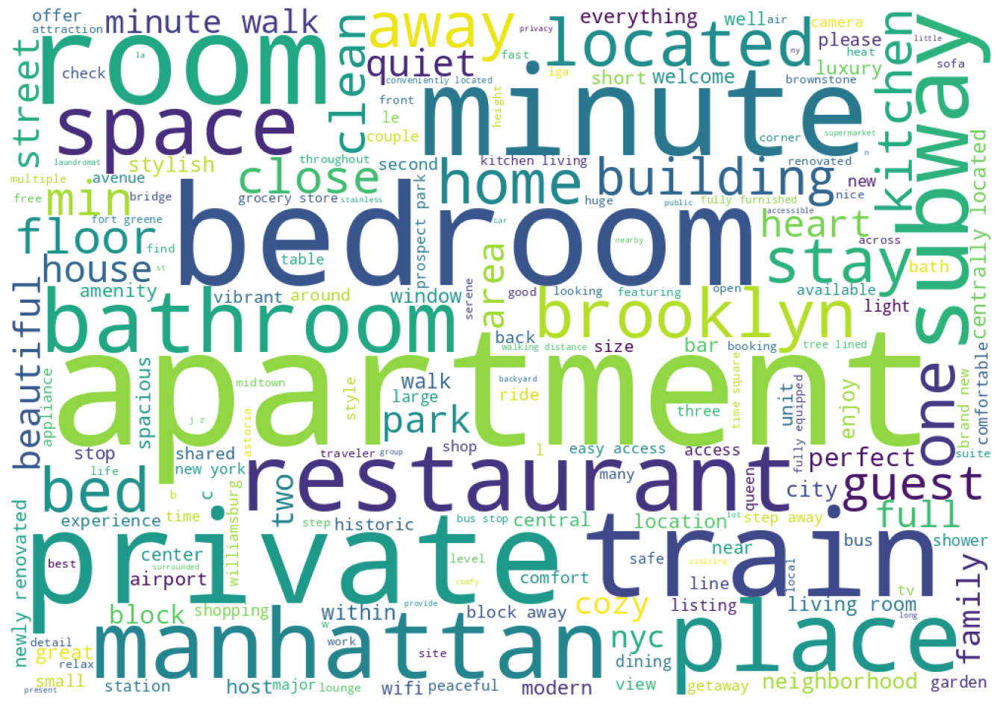

In [ ]:
wordcloud = WordCloud(width = 1000, height = 700, background_color="white").generate(final_words)
plt.figure(figsize=(18,12))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

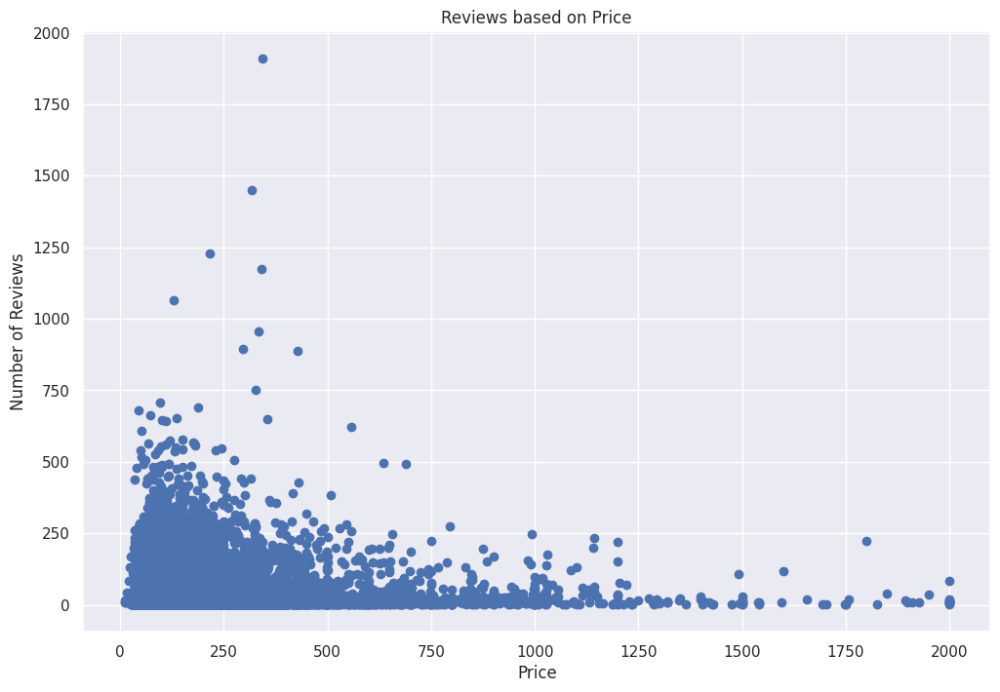

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'df' is your original DataFrame
inputDF = df[['number_of_reviews', 'price', 'review_scores_rating']]

# Filter out rows where the price is more than $2000
filteredDF = inputDF[inputDF['price'] <= 2000]

# Sort the filtered DataFrame by price
price_review = filteredDF[['number_of_reviews', 'price']].sort_values(by='price')

# Plotting
price_review.plot(
    x='price',
    y='number_of_reviews',
    style='o',
    figsize=(12, 8),
    legend=False,
    title='Reviews based on Price'
)

# Setting axis labels
plt.xlabel("Price")
plt.ylabel("Number of Reviews")
plt.show()


<Axes: >

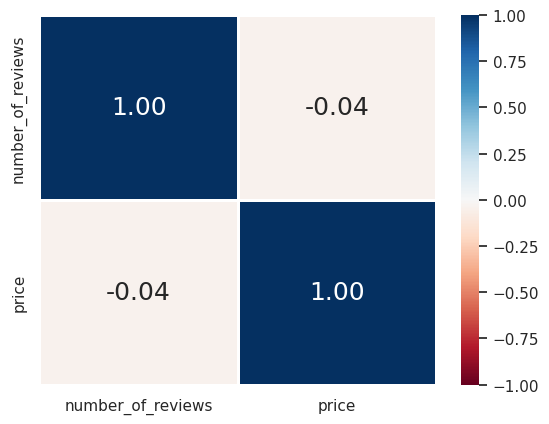

In [ ]:
sb.heatmap(price_review.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

In [ ]:
# !pip install catboost # Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
from sklearn import svm
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score

# Libraries used for Modelling
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from xgboost import plot_importance
from xgboost import plot_tree
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.tree import export_graphviz

In [ ]:
newListingsDF = df[['room_type','property_type','bedrooms','amenities','number_of_reviews', 'price']]
newListingsDF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13115 entries, 1 to 38198
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   room_type          13115 non-null  object 
 1   property_type      13115 non-null  object 
 2   bedrooms           13115 non-null  float64
 3   amenities          13115 non-null  object 
 4   number_of_reviews  13115 non-null  int64  
 5   price              13115 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 717.2+ KB


In [ ]:
import pandas as pd
from collections import Counter

# Process the 'amenities' column to extract individual amenities
amenities_series = newListingsDF['amenities'].apply(lambda x: x.strip('{}').replace('"', '').split(','))

# Flatten the list of lists into a single list containing all amenities
all_amenities = [item.strip() for sublist in amenities_series for item in sublist]

# Count the occurrences of each amenity
amenities_count = Counter(all_amenities)

# Get the top 15 most common amenities
top_15_amenities = amenities_count.most_common(100)

# Convert the top 15 amenities into a set for further use in filtering or encoding
top_15_amenities_set = set([amenity[0] for amenity in top_15_amenities])

# Display the top 15 amenities
print(top_15_amenities_set)


{'Private patio or balcony', 'City skyline view', 'Clothing storage', 'Outdoor furniture', 'Ceiling fan', 'Clothing storage: closet and dresser', 'Elevator]', 'Free washer \\u2013 In unit', 'Stainless steel oven', 'Hangers', '[Hair dryer', 'Iron', 'Bed linens', 'Backyard', 'Lockbox', '[Air conditioning', 'Conditioner', 'Host greets you', 'Hulu', 'Toaster', 'Private backyard \\u2013 Fully fenced', 'Coffee maker: Keurig coffee machine', 'Coffee', 'Essentials', 'Dining table', 'Free dryer \\u2013 In unit', 'Body soap]', 'Oven', 'Dishes and silverware', 'Exterior security cameras on property', 'Single level home', 'Elevator', 'Central heating', 'Dryer', 'Pets allowed', 'Radiant heating', 'Outdoor dining area', 'Central air conditioning', 'Cleaning products', 'Refrigerator', 'Dishwasher', 'Wifi]', 'Freezer', 'TV with standard cable', 'Safe', 'Toaster]', '[Smoke alarm', 'Board games', 'Coffee maker', 'Cleaning available during stay', 'Free street parking', 'Gas stove', 'Drying rack for cloth

In [ ]:
newListingsDF

,room_type,property_type,bedrooms,amenities,number_of_reviews,price
1,Entire home/apt,Entire rental unit,1.0,"[""Hair dryer"", ""Air conditioning"", ""Essentials...",11,202.0
4,Private room,Private room in rental unit,1.0,"[""Smoke alarm"", ""Air conditioning"", ""First aid...",19,105.0
6,Private room,Private room in home,1.0,"[""Hair dryer"", ""Air conditioning"", ""Luggage dr...",4,125.0
7,Private room,Private room in townhouse,1.0,"[""Smoke alarm"", ""Lock on bedroom door"", ""Air c...",57,70.0
10,Entire home/apt,Entire home,3.0,"[""Hair dryer"", ""Dining table"", ""Coffee maker: ...",24,175.0
...,...,...,...,...,...,...
38188,Private room,Private room in rental unit,1.0,"[""Hair dryer"", ""Air conditioning"", ""Dining tab...",48,89.0
38191,Private room,Private room in townhouse,2.0,"[""Hair dryer"", ""Air conditioning"", ""First aid ...",1,110.0
38196,Private room,Private room in bungalow,1.0,"[""Smoke alarm"", ""Air conditioning"", ""Dryer"", ""...",28,99.0
38197,Private room,Private room in rental unit,1.0,"[""Hair dryer"", ""Air conditioning"", ""Dining tab...",134,47.0


In [ ]:
# List of specific amenities to check
amenities_to_check = [
    'Dining table', 'Shower gel', 'Hot water', 'Body soap', 'Oven',
    'Dishes and silverware', 'Laundromat nearby', 'Bathtub',
    'Exterior security cameras on property', 'Shampoo', 'Dedicated workspace',
    'Smoke alarm', 'Stove', 'Hot water kettle', 'Pets allowed',
    'Private entrance', 'Long term stays allowed', 'Heating',
    'Carbon monoxide alarm', 'Room-darkening shades', 'Cleaning products',
    'Refrigerator', 'Fire extinguisher', 'Hangers', 'Hair dryer',
    'Iron', 'Microwave', 'Self check-in', 'Freezer', 'Luggage dropoff allowed',
    'Dishwasher', 'Baking sheet', 'Wine glasses', 'Bed linens', 'Lockbox',
    'Washer', 'Conditioner', 'Wifi', 'Coffee maker', 'Free street parking',
    'Toaster', 'Extra pillows and blankets', 'Cooking basics', 'Kitchen',
    'Air conditioning', 'TV', 'Lock on bedroom door', 'Coffee', 'Essentials',
    'First aid kit'
]

# Create a new column for each amenity with a flag indicating its presence
for amenity in amenities_to_check:
    # The column name will be a sanitized version of the amenity name
    column_name = amenity.lower().replace(' ', '_').replace('[', '').replace(']', '')
    # Create a column where each row checks if the amenity is mentioned in the amenities column
    newListingsDF[column_name] = newListingsDF['amenities'].apply(lambda x: 1 if amenity in x else 0)

# Optionally, check the DataFrame to see the new columns
print(newListingsDF.head())


<ipython-input-144-92961cebf78a>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newListingsDF[column_name] = newListingsDF['amenities'].apply(lambda x: 1 if amenity in x else 0)
<ipython-input-144-92961cebf78a>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newListingsDF[column_name] = newListingsDF['amenities'].apply(lambda x: 1 if amenity in x else 0)
<ipython-input-144-92961cebf78a>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

          room_type                property_type  bedrooms  \
1   Entire home/apt           Entire rental unit       1.0   
4      Private room  Private room in rental unit       1.0   
6      Private room         Private room in home       1.0   
7      Private room    Private room in townhouse       1.0   
10  Entire home/apt                  Entire home       3.0   

                                            amenities  number_of_reviews  \
1   ["Hair dryer", "Air conditioning", "Essentials...                 11   
4   ["Smoke alarm", "Air conditioning", "First aid...                 19   
6   ["Hair dryer", "Air conditioning", "Luggage dr...                  4   
7   ["Smoke alarm", "Lock on bedroom door", "Air c...                 57   
10  ["Hair dryer", "Dining table", "Coffee maker: ...                 24   

    price  dining_table  shower_gel  hot_water  body_soap  ...  toaster  \
1   202.0             0           0          1          1  ...        0   
4   105.0           

In [ ]:
newListingsDF

,room_type,property_type,bedrooms,amenities,number_of_reviews,price,dining_table,shower_gel,hot_water,body_soap,...,toaster,extra_pillows_and_blankets,cooking_basics,kitchen,air_conditioning,tv,lock_on_bedroom_door,coffee,essentials,first_aid_kit
1,Entire home/apt,Entire rental unit,1.0,"[""Hair dryer"", ""Air conditioning"", ""Essentials...",11,202.0,0,0,1,1,...,0,1,1,1,1,1,0,0,1,0
4,Private room,Private room in rental unit,1.0,"[""Smoke alarm"", ""Air conditioning"", ""First aid...",19,105.0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,1
6,Private room,Private room in home,1.0,"[""Hair dryer"", ""Air conditioning"", ""Luggage dr...",4,125.0,0,0,1,0,...,0,1,1,1,1,1,0,1,1,0
7,Private room,Private room in townhouse,1.0,"[""Smoke alarm"", ""Lock on bedroom door"", ""Air c...",57,70.0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,0
10,Entire home/apt,Entire home,3.0,"[""Hair dryer"", ""Dining table"", ""Coffee maker: ...",24,175.0,1,1,1,1,...,1,1,1,1,0,1,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38188,Private room,Private room in rental unit,1.0,"[""Hair dryer"", ""Air conditioning"", ""Dining tab...",48,89.0,1,1,1,1,...,1,1,1,1,1,1,0,1,1,1
38191,Private room,Private room in townhouse,2.0,"[""Hair dryer"", ""Air conditioning"", ""First aid ...",1,110.0,0,0,1,0,...,0,1,1,1,1,1,1,1,1,1
38196,Private room,Private room in bungalow,1.0,"[""Smoke alarm"", ""Air conditioning"", ""Dryer"", ""...",28,99.0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0
38197,Private room,Private room in rental unit,1.0,"[""Hair dryer"", ""Air conditioning"", ""Dining tab...",134,47.0,1,0,1,0,...,0,0,0,0,1,1,1,1,1,0


In [ ]:
# Assuming the previous code snippet has already been run

# Replace all null values in the new columns with zeros
start_index_of_new_columns = newListingsDF.columns.get_loc('dining_table')  # assuming 'dining_table' is the first new column created
cols_to_replace_nulls = newListingsDF.iloc[:, start_index_of_new_columns:].columns
newListingsDF[cols_to_replace_nulls] = newListingsDF[cols_to_replace_nulls].fillna(0)

# Drop the original 'amenities' column from the DataFrame
newListingsDF.drop('amenities', axis=1, inplace=True)

# Verify the changes
newListingsDF.head()


,room_type,property_type,bedrooms,number_of_reviews,price,dining_table,shower_gel,hot_water,body_soap,oven,...,toaster,extra_pillows_and_blankets,cooking_basics,kitchen,air_conditioning,tv,lock_on_bedroom_door,coffee,essentials,first_aid_kit
1,Entire home/apt,Entire rental unit,1.0,11,202.0,0,0,1,1,0,...,0,1,1,1,1,1,0,0,1,0
4,Private room,Private room in rental unit,1.0,19,105.0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,1
6,Private room,Private room in home,1.0,4,125.0,0,0,1,0,1,...,0,1,1,1,1,1,0,1,1,0
7,Private room,Private room in townhouse,1.0,57,70.0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,0
10,Entire home/apt,Entire home,3.0,24,175.0,1,1,1,1,1,...,1,1,1,1,0,1,0,1,1,1


In [ ]:
# Removing the amenities which have all NULL values for all listings
newListingsDF = newListingsDF.dropna(axis=1, how='all')
newListingsDF

,room_type,property_type,bedrooms,number_of_reviews,price,dining_table,shower_gel,hot_water,body_soap,oven,...,toaster,extra_pillows_and_blankets,cooking_basics,kitchen,air_conditioning,tv,lock_on_bedroom_door,coffee,essentials,first_aid_kit
1,Entire home/apt,Entire rental unit,1.0,11,202.0,0,0,1,1,0,...,0,1,1,1,1,1,0,0,1,0
4,Private room,Private room in rental unit,1.0,19,105.0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,1
6,Private room,Private room in home,1.0,4,125.0,0,0,1,0,1,...,0,1,1,1,1,1,0,1,1,0
7,Private room,Private room in townhouse,1.0,57,70.0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,0
10,Entire home/apt,Entire home,3.0,24,175.0,1,1,1,1,1,...,1,1,1,1,0,1,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38188,Private room,Private room in rental unit,1.0,48,89.0,1,1,1,1,1,...,1,1,1,1,1,1,0,1,1,1
38191,Private room,Private room in townhouse,2.0,1,110.0,0,0,1,0,0,...,0,1,1,1,1,1,1,1,1,1
38196,Private room,Private room in bungalow,1.0,28,99.0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
38197,Private room,Private room in rental unit,1.0,134,47.0,1,0,1,0,0,...,0,0,0,0,1,1,1,1,1,0


In [ ]:
newListingsDF.head()

,room_type,property_type,bedrooms,number_of_reviews,price,dining_table,shower_gel,hot_water,body_soap,oven,...,toaster,extra_pillows_and_blankets,cooking_basics,kitchen,air_conditioning,tv,lock_on_bedroom_door,coffee,essentials,first_aid_kit
1,Entire home/apt,Entire rental unit,1.0,11,202.0,0,0,1,1,0,...,0,1,1,1,1,1,0,0,1,0
4,Private room,Private room in rental unit,1.0,19,105.0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,1
6,Private room,Private room in home,1.0,4,125.0,0,0,1,0,1,...,0,1,1,1,1,1,0,1,1,0
7,Private room,Private room in townhouse,1.0,57,70.0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,0
10,Entire home/apt,Entire home,3.0,24,175.0,1,1,1,1,1,...,1,1,1,1,0,1,0,1,1,1


In [ ]:
# Checking to see the total number of each type of property
newListingsDF.property_type.value_counts()

property_type
Entire rental unit                    4901
Private room in rental unit           3063
Private room in home                  1266
Entire home                            759
Private room in townhouse              525
Entire condo                           523
Entire townhouse                       286
Private room in condo                  263
Room in hotel                          217
Entire loft                            216
Entire guest suite                     208
Room in boutique hotel                 124
Private room in guest suite            110
Shared room in rental unit             105
Entire serviced apartment               90
Private room in loft                    62
Private room in serviced apartment      47
Shared room in home                     41
Entire guesthouse                       37
Entire place                            37
Private room in bed and breakfast       35
Private room in casa particular         30
Room in aparthotel                      

In [ ]:
# Grouping property types with less than <100 count into 'Other'
newListingsDF.loc[~newListingsDF.property_type.isin(['Entire rental unit', 'Private room in rental unit', 'Private room in home',
    'Entire home', 'Private room in townhouse', 'Entire condo', 'Entire townhouse',
    'Private room in condo', 'Room in hotel', 'Entire loft', 'Entire guest suite',
    'Room in boutique hotel', 'Private room in guest suite', 'Shared room in rental unit']), 'property_type'] = 'Other'
newListingsDF.property_type.value_counts()

property_type
Entire rental unit             4901
Private room in rental unit    3063
Private room in home           1266
Entire home                     759
Other                           549
Private room in townhouse       525
Entire condo                    523
Entire townhouse                286
Private room in condo           263
Room in hotel                   217
Entire loft                     216
Entire guest suite              208
Room in boutique hotel          124
Private room in guest suite     110
Shared room in rental unit      105
Name: count, dtype: int64

In [ ]:
# newListingsDF.price = newListingsDF.price.str[1:-3]
# newListingsDF.price = newListingsDF.price.str.replace(",", "")
newListingsDF.price = newListingsDF.price.astype('int64')
newListingsDF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13115 entries, 1 to 38198
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   room_type                              13115 non-null  object 
 1   property_type                          13115 non-null  object 
 2   bedrooms                               13115 non-null  float64
 3   number_of_reviews                      13115 non-null  int64  
 4   price                                  13115 non-null  int64  
 5   dining_table                           13115 non-null  int64  
 6   shower_gel                             13115 non-null  int64  
 7   hot_water                              13115 non-null  int64  
 8   body_soap                              13115 non-null  int64  
 9   oven                                   13115 non-null  int64  
 10  dishes_and_silverware                  13115 non-null  int64  
 11  laundro

In [ ]:
# To convert NaN values to 0 for preparation for Modelling
newListingsDF = newListingsDF.fillna(0)
# Checking to ensure that there are no NULL entries
newListingsDF.isnull().sum()

room_type                                0
property_type                            0
bedrooms                                 0
number_of_reviews                        0
price                                    0
dining_table                             0
shower_gel                               0
hot_water                                0
body_soap                                0
oven                                     0
dishes_and_silverware                    0
laundromat_nearby                        0
bathtub                                  0
exterior_security_cameras_on_property    0
shampoo                                  0
dedicated_workspace                      0
smoke_alarm                              0
stove                                    0
hot_water_kettle                         0
pets_allowed                             0
private_entrance                         0
long_term_stays_allowed                  0
heating                                  0
carbon_mono

In [ ]:
# One-hot encode the Categorial variables
transformedDF = pd.get_dummies(newListingsDF, columns=['room_type','property_type'])
# transformedDF
#renaming some categories to remove '/' and blank spaces
newTransformedDF = transformedDF.rename(columns={'room_type_Entire home/apt': 'room_type_Entire_home_apt'})
newTransformedDF =newTransformedDF.rename(columns={'room_type_Private room': 'room_type_Private_room'})
newTransformedDF =newTransformedDF.rename(columns={'room_type_Shared room': 'room_type_Shared_room'})
newTransformedDF =newTransformedDF.rename(columns={'property_type_Bed & Breakfast': 'property_type_Bed_and_Breakfast'})

newTransformedDF.columns

Index(['bedrooms', 'number_of_reviews', 'price', 'dining_table', 'shower_gel',
       'hot_water', 'body_soap', 'oven', 'dishes_and_silverware',
       'laundromat_nearby', 'bathtub', 'exterior_security_cameras_on_property',
       'shampoo', 'dedicated_workspace', 'smoke_alarm', 'stove',
       'hot_water_kettle', 'pets_allowed', 'private_entrance',
       'long_term_stays_allowed', 'heating', 'carbon_monoxide_alarm',
       'room-darkening_shades', 'cleaning_products', 'refrigerator',
       'fire_extinguisher', 'hangers', 'hair_dryer', 'iron', 'microwave',
       'self_check-in', 'freezer', 'luggage_dropoff_allowed', 'dishwasher',
       'baking_sheet', 'wine_glasses', 'bed_linens', 'lockbox', 'washer',
       'conditioner', 'wifi', 'coffee_maker', 'free_street_parking', 'toaster',
       'extra_pillows_and_blankets', 'cooking_basics', 'kitchen',
       'air_conditioning', 'tv', 'lock_on_bedroom_door', 'coffee',
       'essentials', 'first_aid_kit', 'room_type_Entire_home_apt',
    

In [ ]:
# Separating X and y for Modelling
newTransformedDF = newTransformedDF[newTransformedDF["price"] <= 2000]
X = pd.DataFrame(newTransformedDF[[
    'bedrooms', 'dining_table', 'shower_gel',
       'hot_water', 'body_soap', 'oven', 'dishes_and_silverware',
       'laundromat_nearby', 'bathtub', 'exterior_security_cameras_on_property',
       'shampoo', 'dedicated_workspace', 'smoke_alarm', 'stove',
       'hot_water_kettle', 'pets_allowed', 'private_entrance',
       'long_term_stays_allowed', 'heating', 'carbon_monoxide_alarm',
       'room-darkening_shades', 'cleaning_products', 'refrigerator',
       'fire_extinguisher', 'hangers', 'hair_dryer', 'iron', 'microwave',
       'self_check-in', 'freezer', 'luggage_dropoff_allowed', 'dishwasher',
       'baking_sheet', 'wine_glasses', 'bed_linens', 'lockbox', 'washer',
       'conditioner', 'wifi', 'coffee_maker', 'free_street_parking', 'toaster',
       'extra_pillows_and_blankets', 'cooking_basics', 'kitchen',
       'air_conditioning', 'tv', 'lock_on_bedroom_door', 'coffee',
       'essentials', 'first_aid_kit']]) #Predictor Variables
y = pd.DataFrame(newTransformedDF["price"]) #Response Variables

# Scaling
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


In [ ]:
linreg = LinearRegression()
linreg.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

Intercept of Regression 	: b =  [198.47021661]

                               Predictors  Coefficients
0                                bedrooms     78.540780
1                            dining_table     -0.719696
2                              shower_gel      8.838996
3                               hot_water     -7.918626
4                               body_soap     -6.607338
5                                    oven     -0.075719
6                   dishes_and_silverware      0.550289
7                       laundromat_nearby    -12.732518
8                                 bathtub      1.935094
9   exterior_security_cameras_on_property     -8.143178
10                                shampoo     14.465897
11                    dedicated_workspace      3.554929
12                            smoke_alarm      3.828889
13                                  stove     -2.877054
14                       hot_water_kettle      0.940075
15                           pets_allowed     10.065166


In [ ]:
# Predict Response corresponding to Predictors
trainPredictionLR = linreg.predict(X_train)
testPredictionLR = linreg.predict(X_test)

Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

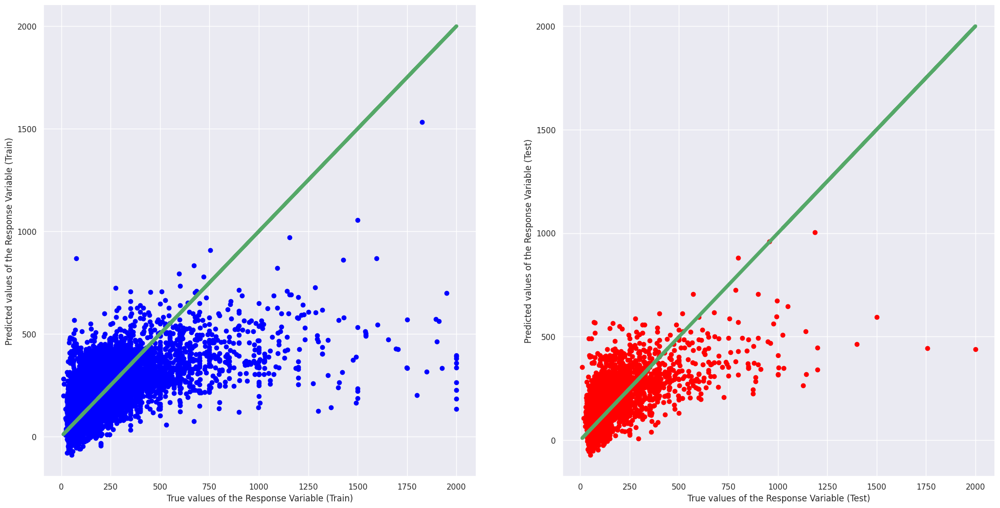

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictionLR, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictionLR, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
#numpy array used for plotting Ridge and Lasson Regression later on
varArr = np.array(['bedrooms', 'dining_table', 'shower_gel',
       'hot_water', 'body_soap', 'oven', 'dishes_and_silverware',
       'laundromat_nearby', 'bathtub', 'exterior_security_cameras_on_property',
       'shampoo', 'dedicated_workspace', 'smoke_alarm', 'stove',
       'hot_water_kettle', 'pets_allowed', 'private_entrance',
       'long_term_stays_allowed', 'heating', 'carbon_monoxide_alarm',
       'room-darkening_shades', 'cleaning_products', 'refrigerator',
       'fire_extinguisher', 'hangers', 'hair_dryer', 'iron', 'microwave',
       'self_check-in', 'freezer', 'luggage_dropoff_allowed', 'dishwasher',
       'baking_sheet', 'wine_glasses', 'bed_linens', 'lockbox', 'washer',
       'conditioner', 'wifi', 'coffee_maker', 'free_street_parking', 'toaster',
       'extra_pillows_and_blankets', 'cooking_basics', 'kitchen',
       'air_conditioning', 'tv', 'lock_on_bedroom_door', 'coffee',
       'essentials', 'first_aid_kit'])

In [ ]:
# initializing the model
ridgeReg = Ridge(alpha=0).fit(X_train,y_train) #alpha is the lambda value

#store the predictions for each lambda/alpha value
ridgeTrainPred = []
ridgeTestPred = []
ridgeR2score = [] # store all the R2 values
lambdaVal = [] #store all values of lambda
#for plotting
ridgeDF = pd.DataFrame({'variable': varArr, 'estimate': ridgeReg.coef_.ravel()})


lambdas = np.arange(0,2000,1) #lambda value of 0 to positive 2000, in intervals of 1

for alpha in lambdas:
    ridgeReg = Ridge(alpha=alpha)
    ridgeReg.fit(X_train, y_train)
    var_name = 'estimate' + str(alpha)
    ridgeDF[var_name] = ridgeReg.coef_.ravel()
    #prediction
    ridgeTrainPred.append(ridgeReg.predict(X_train))
    ridgeTestPred.append(ridgeReg.predict(X_test))
    #storing the R2 scores and lambda value
    ridgeR2score.append(ridgeReg.score(X_train,y_train))
    lambdaVal.append(alpha)

ridgeDF = ridgeDF.set_index('variable').T.rename_axis('estimate').rename_axis(1).reset_index()


bestRidgeR2 = max(ridgeR2score)
print("The highest R2 value: ",bestRidgeR2)
print("The value of lambda that minimises: ",lambdaVal[ridgeR2score.index(bestRidgeR2)])


#Using the best fit Ridge Regression Model's predictions
trainPredictionRidge = ridgeTrainPred[ridgeR2score.index(bestRidgeR2)]
testPredictionRidge = ridgeTestPred[ridgeR2score.index(bestRidgeR2)]
ridgeDF.head()

<ipython-input-185-f65cc31e01dd>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ridgeDF[var_name] = ridgeReg.coef_.ravel()
<ipython-input-185-f65cc31e01dd>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ridgeDF[var_name] = ridgeReg.coef_.ravel()
<ipython-input-185-f65cc31e01dd>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame

The highest R2 value:  0.3587223177417779
The value of lambda that minimises:  0


variable,1,bedrooms,dining_table,shower_gel,hot_water,body_soap,oven,dishes_and_silverware,laundromat_nearby,bathtub,...,toaster,extra_pillows_and_blankets,cooking_basics,kitchen,air_conditioning,tv,lock_on_bedroom_door,coffee,essentials,first_aid_kit
0,estimate,77.721681,0.620291,8.562026,-7.644894,-7.495829,-0.143340,-0.119500,-9.168285,1.645695,...,1.979861,0.858944,-3.551102,-15.705677,4.992629,9.277644,-26.369590,2.770497,6.781577,3.952411
1,estimate0,77.721681,0.620291,8.562026,-7.644894,-7.495829,-0.143340,-0.119500,-9.168285,1.645695,...,1.979861,0.858944,-3.551102,-15.705677,4.992629,9.277644,-26.369590,2.770497,6.781577,3.952411
2,estimate1,77.714127,0.620686,8.560780,-7.643624,-7.493730,-0.144160,-0.121025,-9.168734,1.646044,...,1.980011,0.859359,-3.550851,-15.702922,4.992690,9.277728,-26.369330,2.770152,6.780905,3.952352
3,estimate2,77.706575,0.621081,8.559534,-7.642355,-7.491631,-0.144979,-0.122550,-9.169182,1.646392,...,1.980162,0.859774,-3.550601,-15.700168,4.992751,9.277812,-26.369069,2.769810,6.780234,3.952293
4,estimate3,77.699025,0.621476,8.558289,-7.641086,-7.489534,-0.145798,-0.124073,-9.169631,1.646740,...,1.980312,0.860189,-3.550351,-15.697415,4.992812,9.277896,-26.368808,2.769470,6.779562,3.952234


Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

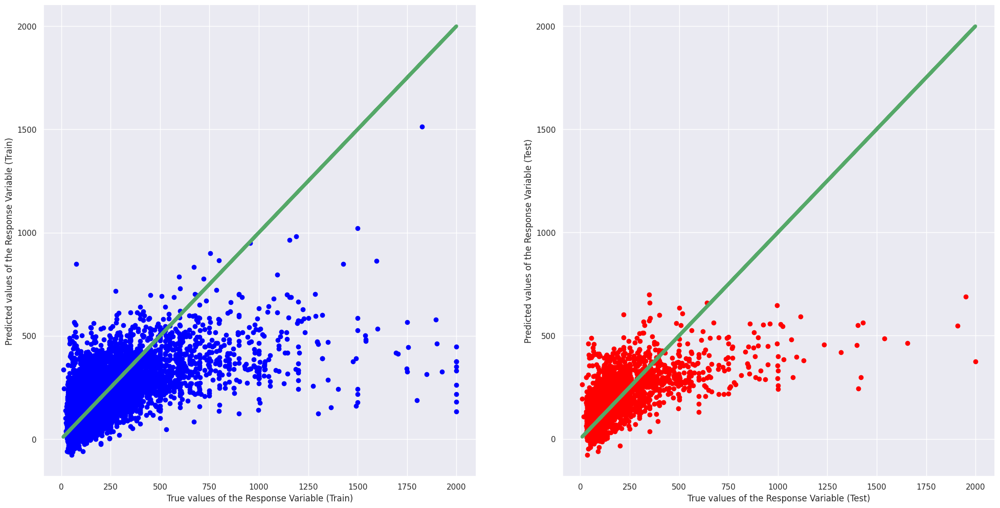

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictionRidge, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictionRidge, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
#initialising the model
lassoReg = Lasso(alpha=1)
lassoReg.fit(X_train, y_train)
#stores prediction
lassoTrainPred = []
lassoTestPred = []
lassoR2score=[] #stores R2 value
lassoDF = pd.DataFrame({'variable': varArr, 'estimate': lassoReg.coef_.ravel()})

lambdas = np.arange(0.01, 8.01, 0.02)#lambda value of 0.01 to 8.01, in intervals of 0.02

for alpha in lambdas:
    lassoReg = Lasso(alpha=alpha)
    lassoReg.fit(X_train, y_train)
    var_name = 'estimate' + str(alpha)
    lassoDF[var_name] = lassoReg.coef_.ravel()
    #prediction
    lassoTrainPred.append(lassoReg.predict(X_train))
    lassoTestPred.append(lassoReg.predict(X_test))
    #storing the r2 score
    lassoR2score.append(lassoReg.score(X_train,y_train))


bestLassoR2 = max(lassoR2score)
print("The highest R2 value: ",bestLassoR2)


#Using the best fit Lasso Regression Model's predictions
trainPredictionLasso = lassoTrainPred[lassoR2score.index(bestLassoR2)]
testPredictionLasso = lassoTestPred[lassoR2score.index(bestLassoR2)]

lassoDF = lassoDF.set_index('variable').T.rename_axis('estimate').rename_axis(1).reset_index()

lassoDF.head()

<ipython-input-188-d2a73d6542cf>:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  lassoDF[var_name] = lassoReg.coef_.ravel()
<ipython-input-188-d2a73d6542cf>:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  lassoDF[var_name] = lassoReg.coef_.ravel()
<ipython-input-188-d2a73d6542cf>:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame

The highest R2 value:  0.3587221604331763


variable,1,bedrooms,dining_table,shower_gel,hot_water,body_soap,oven,dishes_and_silverware,laundromat_nearby,bathtub,...,toaster,extra_pillows_and_blankets,cooking_basics,kitchen,air_conditioning,tv,lock_on_bedroom_door,coffee,essentials,first_aid_kit
0,estimate,77.209471,0.000000,7.482373,-6.043783,-4.643697,-0.000000,-0.000000,-8.359611,0.028505,...,0.755257,0.360938,-1.948515,-15.331976,4.026324,9.057449,-25.896223,2.326301,4.800330,3.546193
1,estimate0.01,77.717781,0.599148,8.552367,-7.628128,-7.462532,-0.138406,-0.111449,-9.160846,1.626680,...,1.969564,0.852881,-3.540458,-15.703827,4.984622,9.275297,-26.365193,2.766358,6.759543,3.948096
2,estimate0.03,77.709939,0.558431,8.534203,-7.593291,-7.394493,-0.127729,-0.094341,-9.144850,1.589206,...,1.948852,0.841185,-3.518928,-15.700282,4.968349,9.270761,-26.356540,2.759486,6.715601,3.939740
3,estimate0.049999999999999996,77.702191,0.517623,8.515707,-7.558843,-7.327407,-0.117614,-0.078677,-9.129704,1.551215,...,1.929385,0.829984,-3.496062,-15.696634,4.951787,9.266293,-26.347774,2.750230,6.672364,3.931512
4,estimate0.06999999999999999,77.694504,0.471826,8.493857,-7.528177,-7.263903,-0.109401,-0.064381,-9.117203,1.512022,...,1.908703,0.816659,-3.475890,-15.692567,4.936463,9.261173,-26.338665,2.741583,6.627891,3.922253


Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

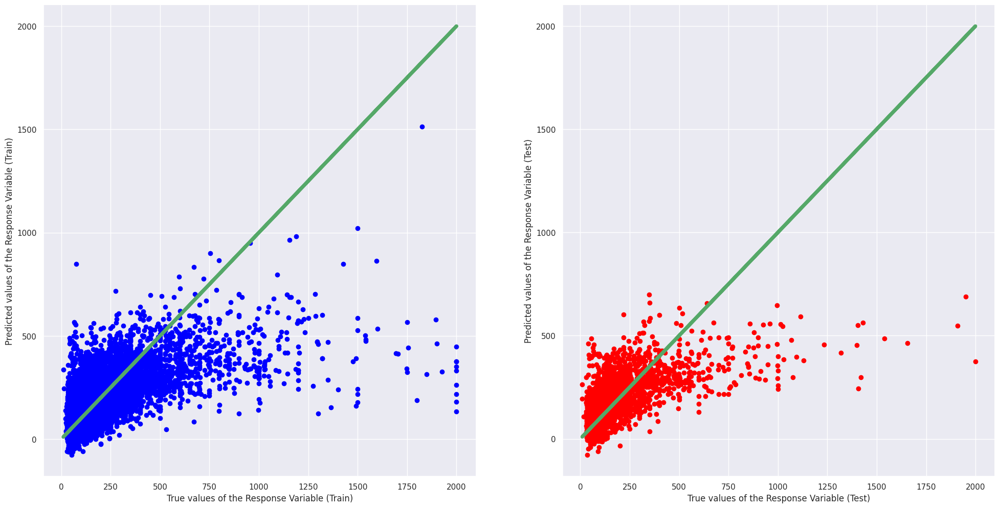

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictionLasso, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictionLasso, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
RF = RandomForestRegressor(n_estimators=2000, max_depth=40,min_samples_split = 50,
                           max_leaf_nodes = 70,max_features = 5).fit(X_train,y_train)

# Predicting the training and testing sets
trainPredictin_RF = RF.predict(X_train)
testPredictin_RF =RF.predict(X_test)

<ipython-input-190-528c254d1d8e>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  max_leaf_nodes = 70,max_features = 5).fit(X_train,y_train)


In [ ]:
importancesRF = RF.feature_importances_
feat_imp1 = pd.DataFrame(importancesRF, columns=['Weight'], index=X_train.columns)
feat_imp1.sort_values('Weight', inplace=True)
feat_imp1

,Weight
wifi,0.002589
smoke_alarm,0.002696
carbon_monoxide_alarm,0.002870
heating,0.003381
hangers,0.003615
stove,0.003998
essentials,0.004120
cleaning_products,0.004182
lockbox,0.004297
oven,0.004313


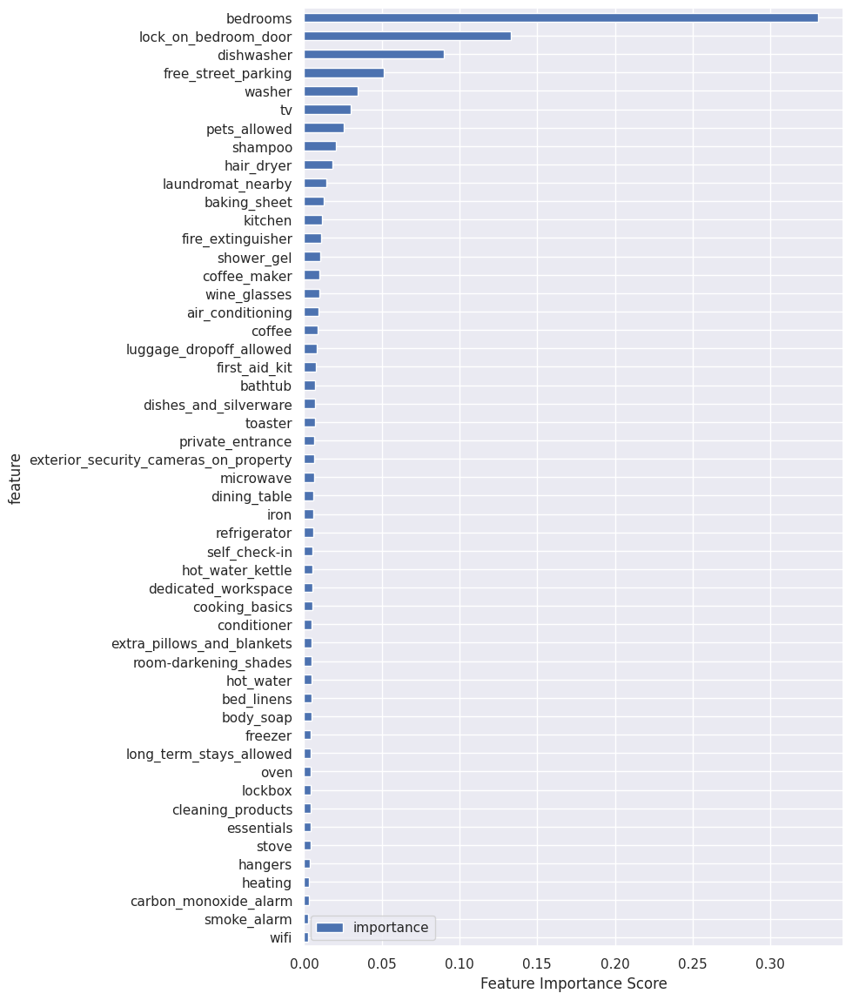

In [ ]:
feat_imp = pd.DataFrame({'importance':RF.feature_importances_})
feat_imp['feature'] = X_train.columns
feat_imp.sort_values(by='importance', ascending=False, inplace=True)

feat_imp.sort_values(by='importance', inplace=True)
feat_imp = feat_imp.set_index('feature', drop=True)
feat_imp.plot.barh(figsize=(8,14))
plt.xlabel('Feature Importance Score')
plt.show()

Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

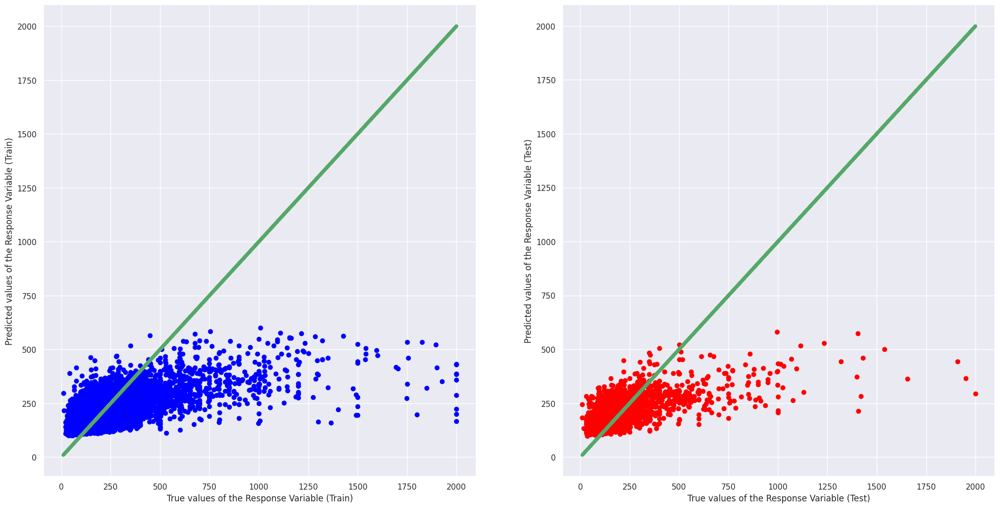

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictin_RF, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictin_RF, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
# Fitting and Training the model for Train & Test sets
xgb_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 3, alpha = 10, n_estimators = 2000)

xgb_reg.fit(X_train,y_train)

# Predicting using the model
trainPredictin_xgb_reg = xgb_reg.predict(X_train)
testPredictin_xgb_reg = xgb_reg.predict(X_test)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [08:46:27] WARNING: /workspace/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)


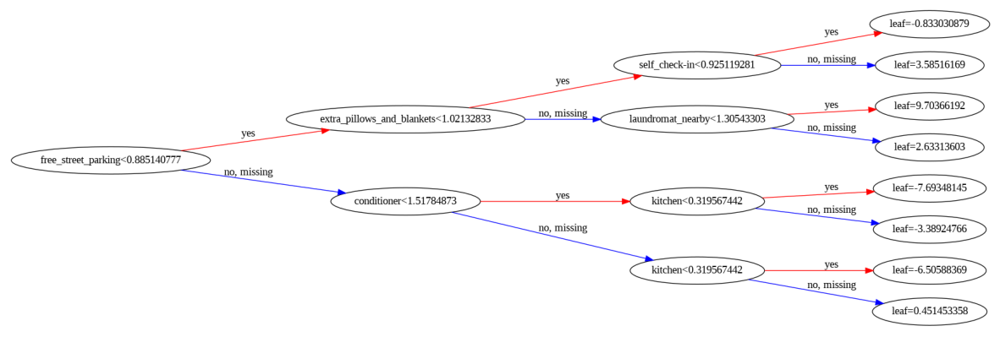

In [ ]:
# Ploting decision tree
xgb.plot_tree(xgb_reg, num_trees=0, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(15, 20)

In [ ]:
# Weightage/Importance of each variable
ft_weights_xgb_reg = pd.DataFrame(xgb_reg.feature_importances_, columns=['weight'], index=X_train.columns)
ft_weights_xgb_reg.sort_values('weight', inplace=True)
ft_weights_xgb_reg

,weight
smoke_alarm,0.003161
carbon_monoxide_alarm,0.005821
hangers,0.006473
oven,0.006744
bed_linens,0.007183
dedicated_workspace,0.007325
lockbox,0.007601
cooking_basics,0.007874
refrigerator,0.008048
essentials,0.008122


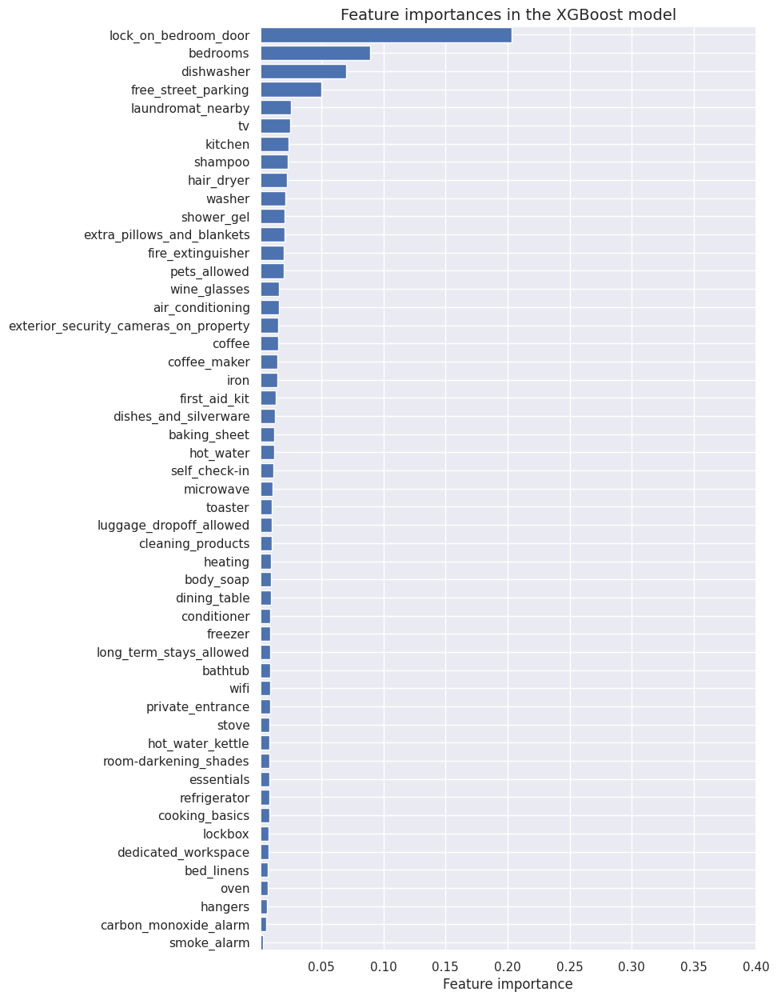

In [ ]:
# Plotting feature importances
plt.figure(figsize=(8,15))
plt.barh(ft_weights_xgb_reg.index, ft_weights_xgb_reg.weight, align='center')
plt.title("Feature importances in the XGBoost model", fontsize=14)
plt.xlabel("Feature importance")
plt.margins(y=0.001)
plt.xlim(0.001, 0.4)
plt.show()

Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

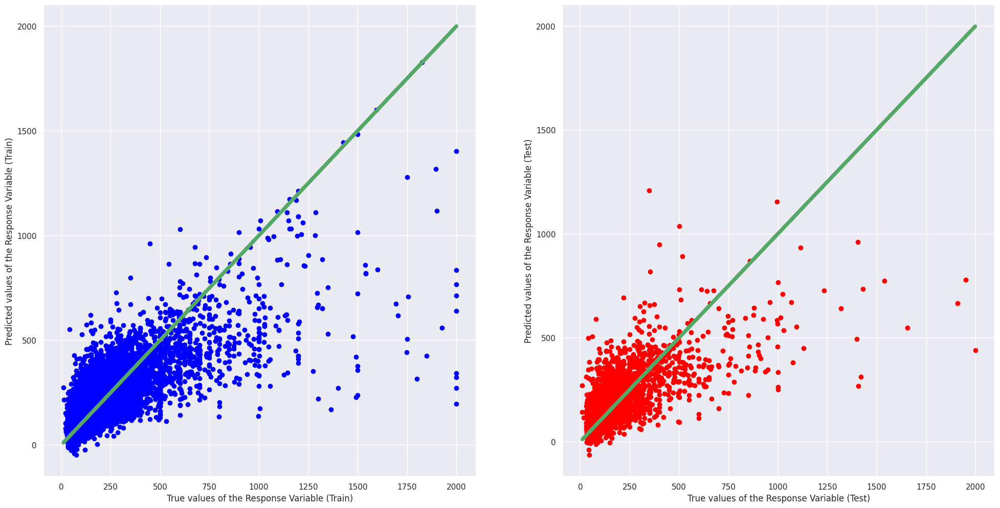

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictin_xgb_reg, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictin_xgb_reg, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
catBoost = CatBoostRegressor()
parameters = {'depth'         : [3,5],
                'learning_rate' : [0.1,0.5],
                'iterations'    : [2000]
                }
grid = GridSearchCV(estimator=catBoost, param_grid = parameters, cv = 2, n_jobs=6)
grid.fit(X_train, y_train)

print("\n The best parameters across ALL searched params:\n",
          grid.best_params_)

0:	learn: 189.8639184	total: 48.4ms	remaining: 1m 36s
1:	learn: 186.1126069	total: 51.1ms	remaining: 51s
2:	learn: 182.9750127	total: 54.3ms	remaining: 36.2s
3:	learn: 179.9171532	total: 60.2ms	remaining: 30s
4:	learn: 177.3991271	total: 64.2ms	remaining: 25.6s
5:	learn: 175.2456726	total: 68.3ms	remaining: 22.7s
6:	learn: 173.4398792	total: 72.7ms	remaining: 20.7s
7:	learn: 171.7124715	total: 75.4ms	remaining: 18.8s
8:	learn: 170.2840358	total: 80ms	remaining: 17.7s
9:	learn: 169.0031245	total: 84.1ms	remaining: 16.7s
10:	learn: 167.8426674	total: 88.2ms	remaining: 15.9s
11:	learn: 166.7204715	total: 92.6ms	remaining: 15.3s
12:	learn: 165.7464533	total: 96.8ms	remaining: 14.8s
13:	learn: 164.8701188	total: 101ms	remaining: 14.3s
14:	learn: 164.2241740	total: 105ms	remaining: 13.9s
15:	learn: 163.5676135	total: 110ms	remaining: 13.6s
16:	learn: 162.9444880	total: 114ms	remaining: 13.3s
17:	learn: 162.3425048	total: 118ms	remaining: 13s
18:	learn: 161.8276270	total: 122ms	remaining: 12.

In [ ]:
# Creating and fitting the model
CatB=CatBoostRegressor(iterations=2000, depth=3, learning_rate=0.1,loss_function='RMSE')
CatB.fit(X_train, y_train,plot=True);

# Predicting based on the model
trainPrediction_CatB = CatB.predict(X_train)
testPrediction_CatB = CatB.predict(X_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 189.8639184	total: 2.2ms	remaining: 4.4s
1:	learn: 186.1126069	total: 4.41ms	remaining: 4.4s
2:	learn: 182.9750127	total: 6.23ms	remaining: 4.15s
3:	learn: 179.9171532	total: 8.04ms	remaining: 4.01s
4:	learn: 177.3991271	total: 9.77ms	remaining: 3.9s
5:	learn: 175.2456726	total: 11.5ms	remaining: 3.82s
6:	learn: 173.4398792	total: 13.4ms	remaining: 3.8s
7:	learn: 171.7124715	total: 15.1ms	remaining: 3.77s
8:	learn: 170.2840358	total: 16.9ms	remaining: 3.74s
9:	learn: 169.0031245	total: 18.8ms	remaining: 3.74s
10:	learn: 167.8426674	total: 20.5ms	remaining: 3.71s
11:	learn: 166.7204715	total: 22.2ms	remaining: 3.68s
12:	learn: 165.7464533	total: 23.9ms	remaining: 3.65s
13:	learn: 164.8701188	total: 25.6ms	remaining: 3.63s
14:	learn: 164.2241740	total: 27.3ms	remaining: 3.61s
15:	learn: 163.5676135	total: 28.8ms	remaining: 3.56s
16:	learn: 162.9444880	total: 30.5ms	remaining: 3.56s
17:	learn: 162.3425048	total: 32.4ms	remaining: 3.56s
18:	learn: 161.8276270	total: 34.2ms	remain

(0.001, 20.0)

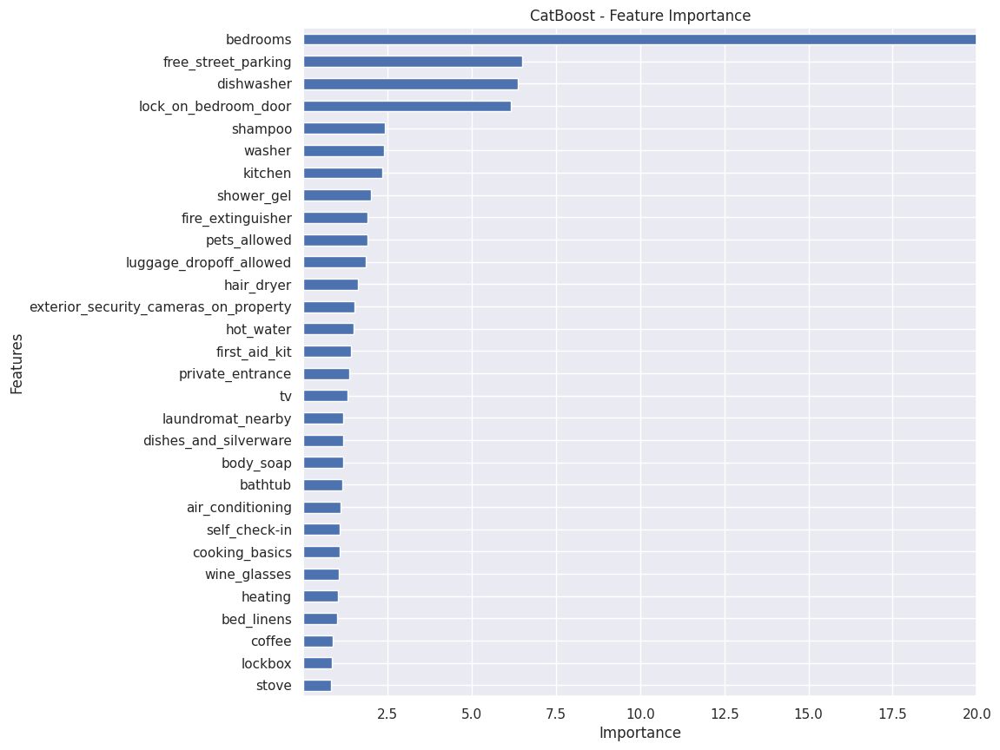

In [ ]:
# Plotting the feature importance diagram
feature_impCatB = pd.DataFrame({'imp': CatB.feature_importances_, 'col': X.columns})
feature_impCatB = feature_impCatB.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
feature_impCatB.plot(kind='barh', x='col', y='imp', figsize=(10, 10), legend=None)
plt.title('CatBoost - Feature Importance')
plt.ylabel('Features')
plt.xlabel('Importance');
plt.xlim(0.001, 20.0)

Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

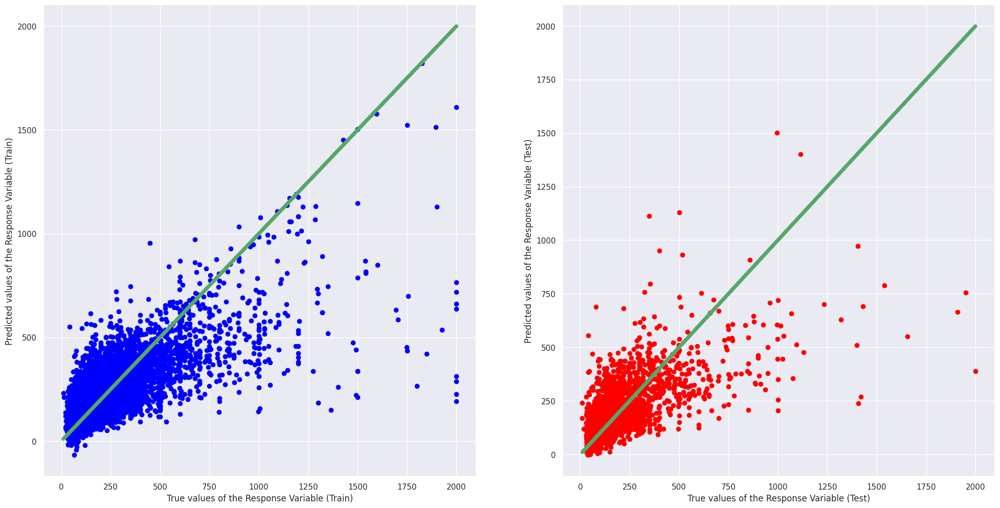

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPrediction_CatB, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPrediction_CatB, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
# Results of Model
print ("Goodness Fit on the Models (Train/Test Split):")
print()
print("Performance Metrics for Test Set")
print("--------------------------------")
print("Linear Regression (MSE):", round(mean_squared_error(y_test, testPredictionLR),4))
print("Linear Regression (R^2):", round(r2_score(y_test, testPredictionLR),4))

print("\nRidge Regression (MSE):", round(mean_squared_error(y_test, testPredictionRidge),4))
print("Ridge Regression (R^2):", round(r2_score(y_test, testPredictionRidge),4))

print("\nLasso Regression (MSE):", round(mean_squared_error(y_test, testPredictionLasso),4))
print("Lasso Regression (R^2):", round(r2_score(y_test, testPredictionLasso),4))

print("\nRandom Forest Regression (MSE):", round(mean_squared_error(y_test, testPredictin_RF),4))
print("Random Forest Regression (R^2):", round(r2_score(y_test, testPredictin_RF),4))

print("\nXGBoost (MSE):", round(mean_squared_error(y_test, testPredictin_xgb_reg),4))
print("XGBoost (R^2):", round(r2_score(y_test, testPredictin_xgb_reg),4))

print("\nCatBoost (MSE):", round(mean_squared_error(y_test, testPrediction_CatB),4))
print("CatBoost (R^2):", round(r2_score(y_test, testPrediction_CatB ),4))


print()
print("\nPerformance Metrics for Train Set")
print("-----------------------------------")
print("Linear Regression (R^2):", round(r2_score(y_train, trainPredictionLR),4))
print("Ridge Regression (R^2):", round(r2_score(y_train, trainPredictionRidge),4))
print("Lasso Regression (R^2):", round(r2_score(y_train, trainPredictionLasso),4))
print("Random Forest Regression (R^2):", round(r2_score(y_train, trainPredictin_RF),4))
print("XGBoost (R^2):", round(r2_score(y_train, trainPredictin_xgb_reg),4))
print("CatBoost (R^2):", round(r2_score(y_train, trainPrediction_CatB ),4))

Goodness Fit on the Models (Train/Test Split):

Performance Metrics for Test Set
--------------------------------
Linear Regression (MSE): 47887.3145
Linear Regression (R^2): -0.3902

Ridge Regression (MSE): 22336.1756
Ridge Regression (R^2): 0.3516

Lasso Regression (MSE): 22336.3414
Lasso Regression (R^2): 0.3516

Random Forest Regression (MSE): 22449.515
Random Forest Regression (R^2): 0.3483

XGBoost (MSE): 19281.2912
XGBoost (R^2): 0.4403

CatBoost (MSE): 19556.4369
CatBoost (R^2): 0.4323


Performance Metrics for Train Set
-----------------------------------
Linear Regression (R^2): -0.3704
Ridge Regression (R^2): 0.3587
Lasso Regression (R^2): 0.3587
Random Forest Regression (R^2): 0.364
XGBoost (R^2): 0.5739
CatBoost (R^2): 0.5634


In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits = 10, shuffle=True, random_state=100)

scoring = ['r2', 'neg_mean_squared_error']

results_kfold_LR = cross_validate(linreg,X,y,cv=kf,scoring=scoring)
results_kfold_Ridge = cross_validate(ridgeReg,X,y,cv=kf,scoring=scoring)
results_kfold_Lasso = cross_validate(lassoReg,X,y,cv=kf,scoring=scoring)
results_kfold_RF = cross_validate(RF,X,y,cv=kf,scoring=scoring)
results_kfold_XGB = cross_validate(xgb_reg,X,y,cv=kf,scoring=scoring)
results_kfold_CatB = cross_validate(CatB,X,y,cv=kf,scoring=scoring)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed whe

Streaming output truncated to the last 5000 lines.
1000:	learn: 132.7413839	total: 2.85s	remaining: 2.85s
1001:	learn: 132.7322698	total: 2.86s	remaining: 2.85s
1002:	learn: 132.7278556	total: 2.86s	remaining: 2.84s
1003:	learn: 132.7206269	total: 2.86s	remaining: 2.84s
1004:	learn: 132.7156168	total: 2.86s	remaining: 2.83s
1005:	learn: 132.7074613	total: 2.86s	remaining: 2.83s
1006:	learn: 132.7013523	total: 2.87s	remaining: 2.83s
1007:	learn: 132.6907996	total: 2.87s	remaining: 2.82s
1008:	learn: 132.6813372	total: 2.87s	remaining: 2.82s
1009:	learn: 132.6729734	total: 2.87s	remaining: 2.81s
1010:	learn: 132.6618120	total: 2.87s	remaining: 2.81s
1011:	learn: 132.6601225	total: 2.88s	remaining: 2.81s
1012:	learn: 132.6593590	total: 2.88s	remaining: 2.8s
1013:	learn: 132.6558722	total: 2.88s	remaining: 2.8s
1014:	learn: 132.6383294	total: 2.88s	remaining: 2.79s
1015:	learn: 132.6362980	total: 2.88s	remaining: 2.79s
1016:	learn: 132.6301494	total: 2.88s	remaining: 2.79s
1017:	learn: 132

In [ ]:
print ("Goodness Fit on the Models (K-Fold Cross Validation):")
print()

print("Linear Regression R^2:" , round(results_kfold_LR['test_r2'].mean(),4))
print("Ridge Regression R^2:" , round(results_kfold_Ridge['test_r2'].mean(),4))
print("Lasso Regression R^2:" , round(results_kfold_Lasso['test_r2'].mean(),4))
print("Random Forest R^2:" , round(results_kfold_RF['test_r2'].mean(),4))
print("XGBooost R^2:" , round(results_kfold_XGB['test_r2'].mean(),4))
print("CatBoost R^2:",round(results_kfold_CatB['test_r2'].mean(),4))
print()
print("Linear Regression MSE:" , -round(results_kfold_LR['test_neg_mean_squared_error'].mean(),4))
print("Ridge Regression MSE:" , -round(results_kfold_Ridge['test_neg_mean_squared_error'].mean(),4))
print("Lasso Regression MSE:" , -round(results_kfold_Lasso['test_neg_mean_squared_error'].mean(),4))
print("Random Forest MSE:" , -round(results_kfold_RF['test_neg_mean_squared_error'].mean(),4))
print("XGBooost MSE:" , -round(results_kfold_XGB['test_neg_mean_squared_error'].mean(),4))
print("CatBoost MSE:",-round(results_kfold_CatB['test_neg_mean_squared_error'].mean(),4))

Goodness Fit on the Models (K-Fold Cross Validation):

Linear Regression R^2: 0.3538
Ridge Regression R^2: 0.3501
Lasso Regression R^2: 0.3274
Random Forest R^2: 0.3309
XGBooost R^2: 0.4175
CatBoost R^2: 0.4141

Linear Regression MSE: 24015.2717
Ridge Regression MSE: 24165.6798
Lasso Regression MSE: 24987.1566
Random Forest MSE: 24921.7257
XGBooost MSE: 21628.1207
CatBoost MSE: 21753.6829
